# Homework #4
Due 11:59 pm EST, Friday March 18th, 2022.

Email your solutions (both .ipnb and .html files) to: compscbio@gmail.com.

### Background:

A post-doc in your lab has just read the Cytotrace paper and is _very_ excited about it. But, as you are now a seasoned professional, your enthusiasm is a bit more modest and you decide to try it out before adding it to your rapidly expanding toolkit of sc analysis methods. You decide to see how well the Cytotrace score correlates with pseduotime computed on data for which you can reasonably anchor the starting point of the trajectory inference.


### The data
1. [The day 4 mESC data that we keep using over and over again](https://compstemcellbio.s3.amazonaws.com/2022/homework/04/adata_HW4_mESC_day4.h5ad)
This is the raw counts data, however, we have cleaned it (i.e. removed potential doublets, low quality cells, and mito, ribo and malat genes). In terms of pre-processing, all you have to do is deal with rarely detected genes and normalization.

2. [The day 0-4 mESC data that we used in HW2](https://compstemcellbio.s3.amazonaws.com/2022/homework/04/adata_HW4_mESC_from_HW2.h5ad)
This is the raw counts data. Just like the data from #1 above, we have cleaned this data. Moreover, we have removed the MEFs, so you should start your analysis at the point of dealing with undetected genes.


### Your mission:

Produce one figure per data set that illustrate the relationship between pseudotime and Cytotrace time (i.e. 1- Cytotrace score). The idea here is to see how well Cytotrace works on data that you know well. You will need to perform pseudotime analysis using diffusion maps, and judicisouly select a root based on cluster annotation. You may wish to color your scatterplots by cluster (or cell type), or facet them, to get a sense of how the relationships vary by cell type.

In [1]:
# load in depends
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy as sp
import numpy as np
import warnings

# NB these new packages
import scvelo as scv

sc.settings.set_figure_params(dpi=80)
warnings.filterwarnings('ignore')

# below handles a scipy error I was getting
from PyInstaller.utils.hooks import collect_data_files
datas = collect_data_files("scipy.special")

from cellrank.tl.kernels import CytoTRACEKernel

In [2]:
# read in both datasets
adata4 = sc.read_h5ad('adata_HW4_mESC_day4.h5ad')
adata = sc.read_h5ad('adata_HW4_mESC_from_HW2.h5ad')

In [3]:
# adata4.obs

In [4]:
# adata.obs

In [5]:
# removes rare genes and performs norm/log/hvg

def filterRareGenes_norm(anndata):
    # we need to deal with rarely detected genes and normalize
    adNorm = anndata.copy()

    # filter out rarely detected genes
    sc.pp.filter_genes(adNorm, min_cells=5)

    # norm/log/hvg
    sc.pp.normalize_per_cell(adNorm, counts_per_cell_after=1e4)
    sc.pp.log1p(adNorm)
    sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=5, min_disp=0.25)
    
    return adNorm

In [6]:
# start with day 4 data
ad4Norm = filterRareGenes_norm(adata4)

In [7]:
# This is a necessary hack. See CellRank docs
# function to perform the hack from lecture
def hack(adM1Norm):
    # This is a necessary hack. See CellRank docs
    adM1Norm.layers["spliced"] = adM1Norm.X
    adM1Norm.layers["unspliced"] = adM1Norm.X
    scv.pp.moments(adM1Norm, n_pcs=30, n_neighbors=30)

In [8]:
hack(ad4Norm)
ad4Norm

computing neighbors
    finished (0:00:09) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


AnnData object with n_obs × n_vars = 5134 × 15567
    obs: 'sampleName', 'n_genes_by_counts', 'total_counts', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'gene_ids', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'spliced', 'unspliced', 'Ms', 'Mu'
    obsp: 'distances', 'connectivities'

In [9]:
ctk = CytoTRACEKernel(ad4Norm)

In [10]:
ctk

<CytoTRACEKernel>

In [11]:
# scale, compute, and plot pca vs var ratio
def scalePCA(adM1Norm):
    adM1Norm.raw = adM1Norm
    sc.pp.scale(adM1Norm, max_value=10)
    sc.tl.pca(adM1Norm, n_comps=100)
    sc.set_figure_params(figsize="10, 4")
    sc.pl.pca_variance_ratio(adM1Norm, 100)

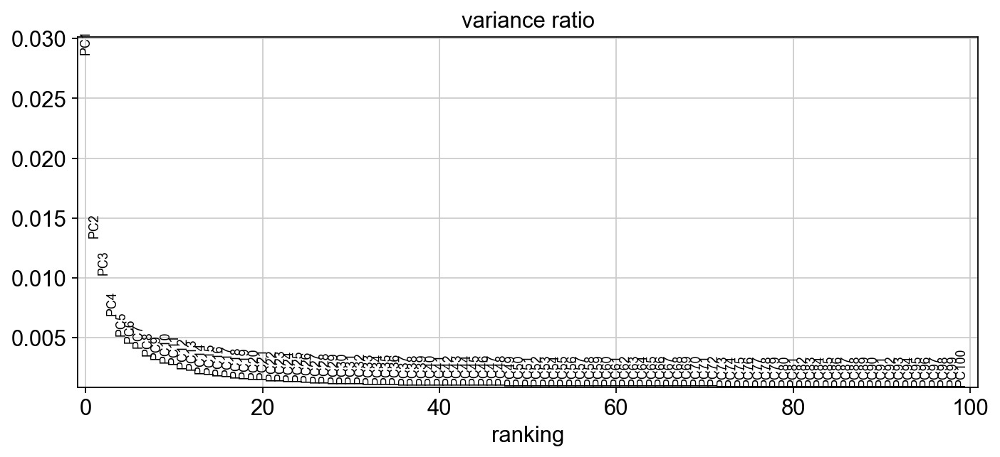

In [12]:
scalePCA(ad4Norm)

In [13]:
# compute leiden
def compLeiden(adM1Norm, npcs = 15, nknns = 15):
    sc.pp.neighbors(adM1Norm, n_neighbors=nknns, n_pcs=npcs)
    sc.tl.leiden(adM1Norm,.25)
    
    
# plot leiden
def plotLeiden(adM1Norm):
    fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
    sc.pl.pca(adM1Norm, color=["leiden"], alpha=.7, s=20, components="1,2",legend_loc='on data', ax=axs[0], show=False)
    sc.pl.pca(adM1Norm, color=["leiden"], alpha=.7, s=20, components="1,3",legend_loc='on data', ax=axs[1], show=False)

In [14]:
compLeiden(ad4Norm)

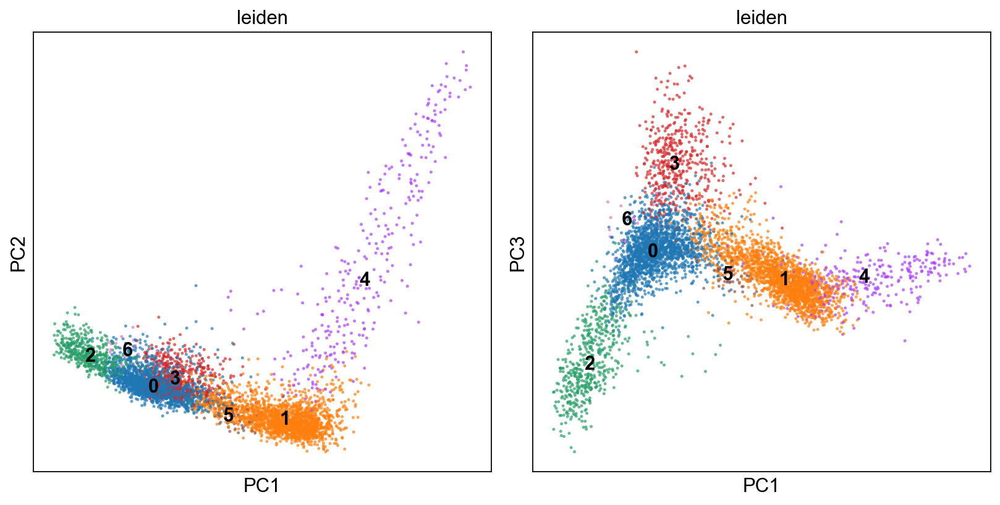

In [15]:
plotLeiden(ad4Norm)

In [16]:
# plot leiden colored by pseudotime (PDT) and ct_score
def plotLeidenPDT(adM1Norm):
    fig, axs = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
    sc.pl.pca(adM1Norm, color=["ct_pseudotime"], alpha=.7, s=20, components="1,3",legend_loc='on data', ax=axs[0], show=False)
    sc.pl.pca(adM1Norm, color=["ct_score"], alpha=.7, s=20, components="1,3",legend_loc='on data', ax=axs[1], show=False)

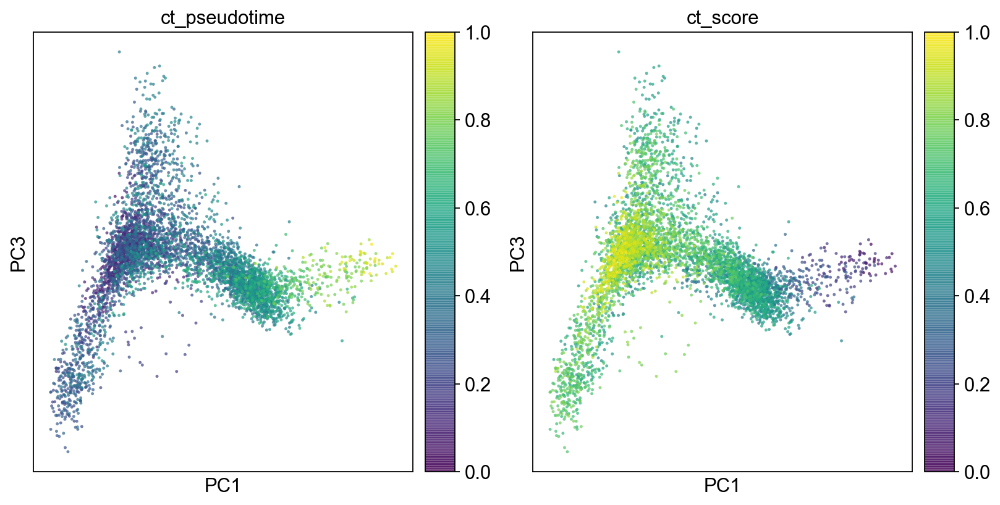

In [17]:
plotLeidenPDT(ad4Norm)

In [18]:
# email with Dan, was told to leave all clusters in 
# # remove the 2 clusters that don't look like anthing (5&6 here)
# ad4X = ad4Norm[ad4Norm.obs['leiden'] != "6"].copy()
# ad4X = ad4X[ad4X.obs['leiden'] != "5"].copy()
# ad4X

In [19]:
ad4X= ad4Norm

In [20]:
# rank genes and dotplot em
def rankGenes_dpt(adM1X):
    sc.tl.rank_genes_groups(adM1X, 'leiden')
    sc.pl.rank_genes_groups_dotplot(adM1X, n_genes=8, groupby='leiden', use_raw=False, dendrogram=False)

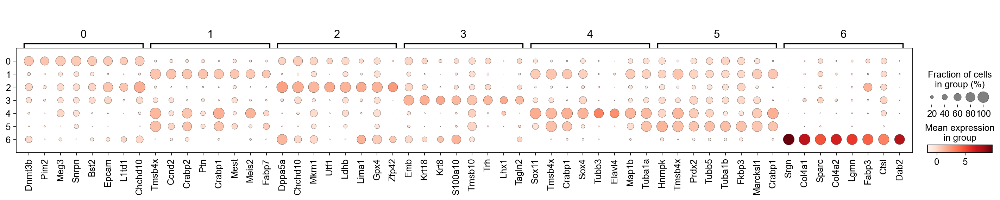

In [21]:
rankGenes_dpt(ad4X)

In [22]:
# # rename the leidens following lecture
# new_sc_names = ["Primed","Ect", "PGC", "PrimStr", "NC"]
# ad4X.rename_categories('leiden', new_sc_names)

In [23]:
# compute diff map and plot 
def diffMap(adM1X):
    sc.tl.diffmap(adM1X)
    sc.set_figure_params(figsize="6,6")
    sc.pl.diffmap(adM1X, color="leiden", components=["1,3"], legend_loc="on data")

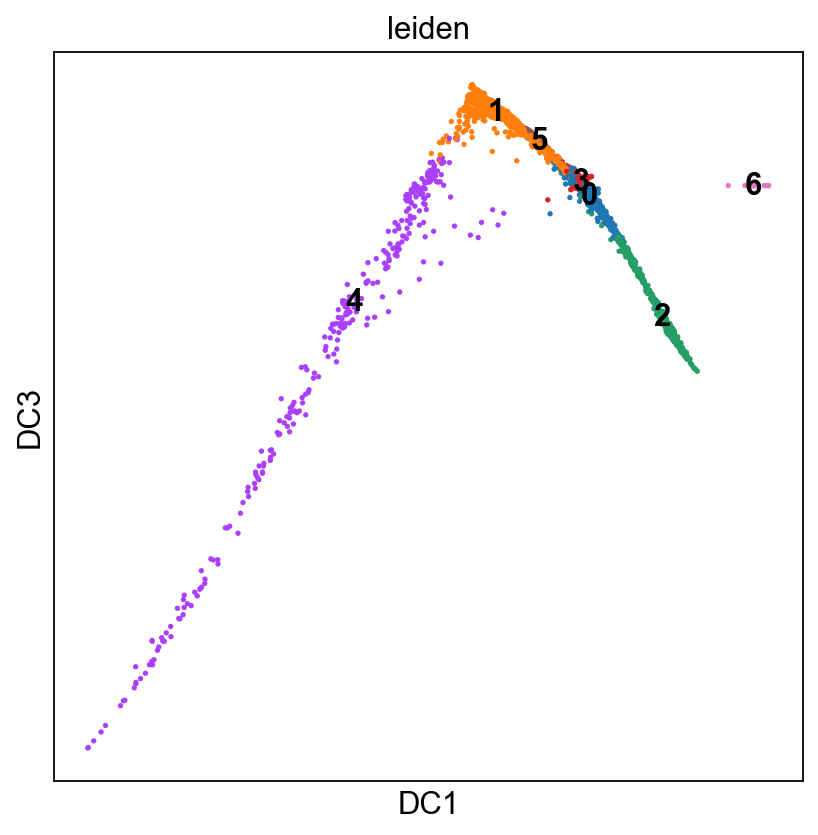

In [24]:
diffMap(ad4X)

In [25]:
def findRoot(anndata):
    # genes_plur is naive and primed genesets combined 
    pluri_genes = [x.strip() for x in open("genes_pluri.csv")]
    sc.tl.score_genes(anndata, gene_list = pluri_genes, score_name = "pluri_genesets", use_raw=False)
    print(anndata.obs.groupby('leiden').agg({'pluri_genesets':'mean'}))

In [26]:
findRoot(ad4X)

        pluri_genesets
leiden                
0             0.147207
1            -0.257209
2             0.674911
3            -0.122884
4            -0.206670
5            -0.194674
6            -0.093017


In [27]:
# define the root 
# ad4X.uns['iroot'] = np.flatnonzero(ad4X.obs['leiden']  == 'Primed')[0]
# define root following the lecture

# after speaking with Dan, he informed me that the cluster with the highest expr of pluri genes should be classified as the root
# this makes sense as other cells are 'more differentiated' that the most pluri cells and should stem off them 
# i will be applying this logic for the next datasets as well
# define root by picking cluster with highest mean plur geneset score, here it is cluster 2
ad4X.uns['iroot'] = np.flatnonzero(ad4X.obs['leiden']  == '2')[0]
sc.tl.dpt(ad4X)

In [28]:
# plot comparisons vs ct pdt
def comparePlots(adM1X):
    # plot dpt pdt vs ct pdt
    sc.pl.diffmap(adM1X, color=["dpt_pseudotime","ct_pseudotime"], components=("1,3"), legend_loc='on data')
    sc.pl.violin(adM1X, "dpt_pseudotime", groupby="leiden")
    sc.pl.violin(adM1X, "ct_pseudotime", groupby="leiden")
    sc.pl.diffmap(adM1X, color=["leiden", "ct_score"], alpha=.9, s=35, projection='3d')

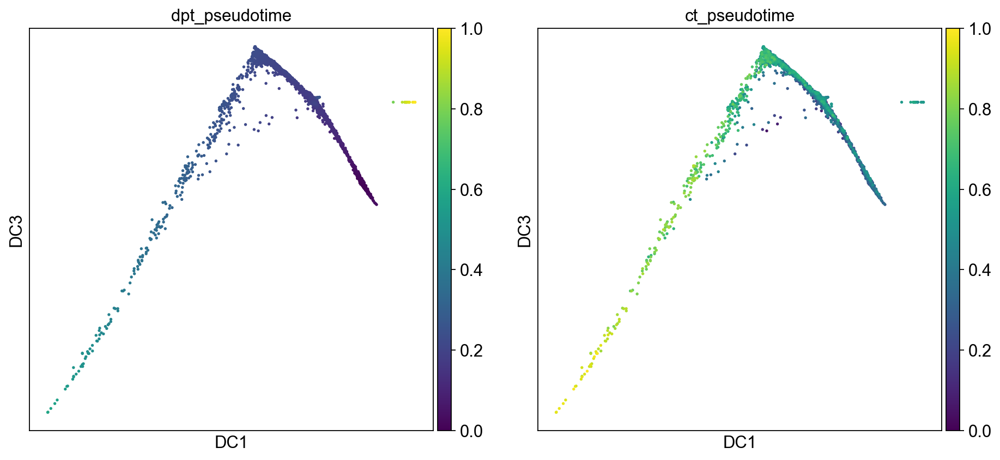

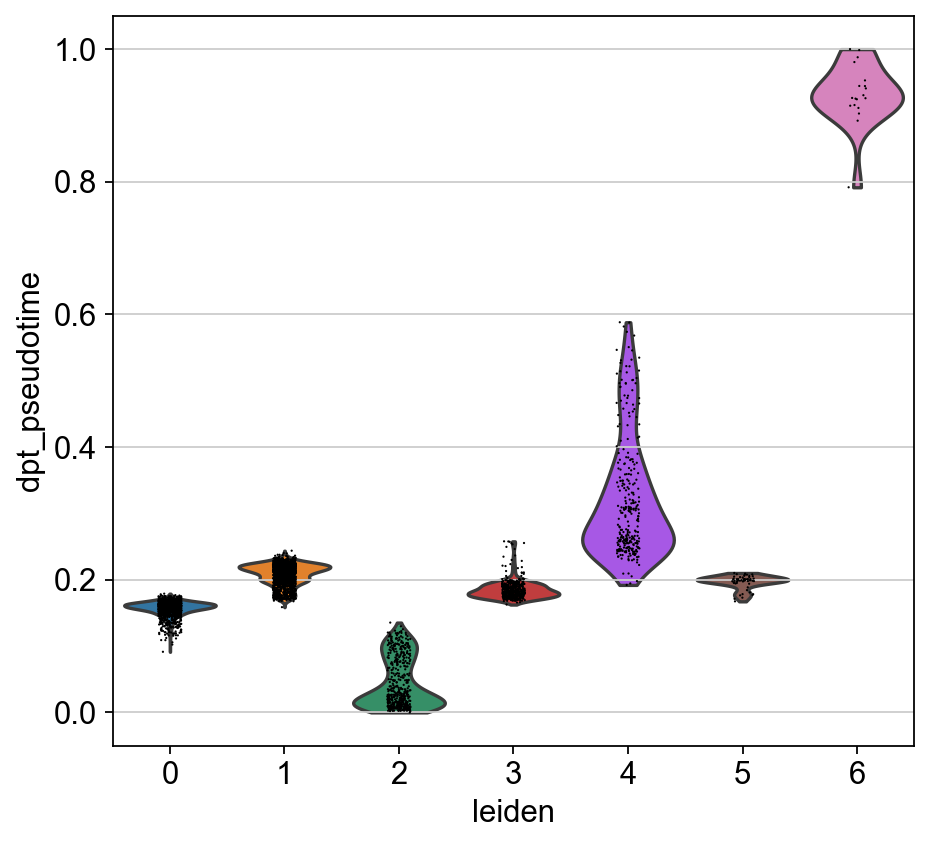

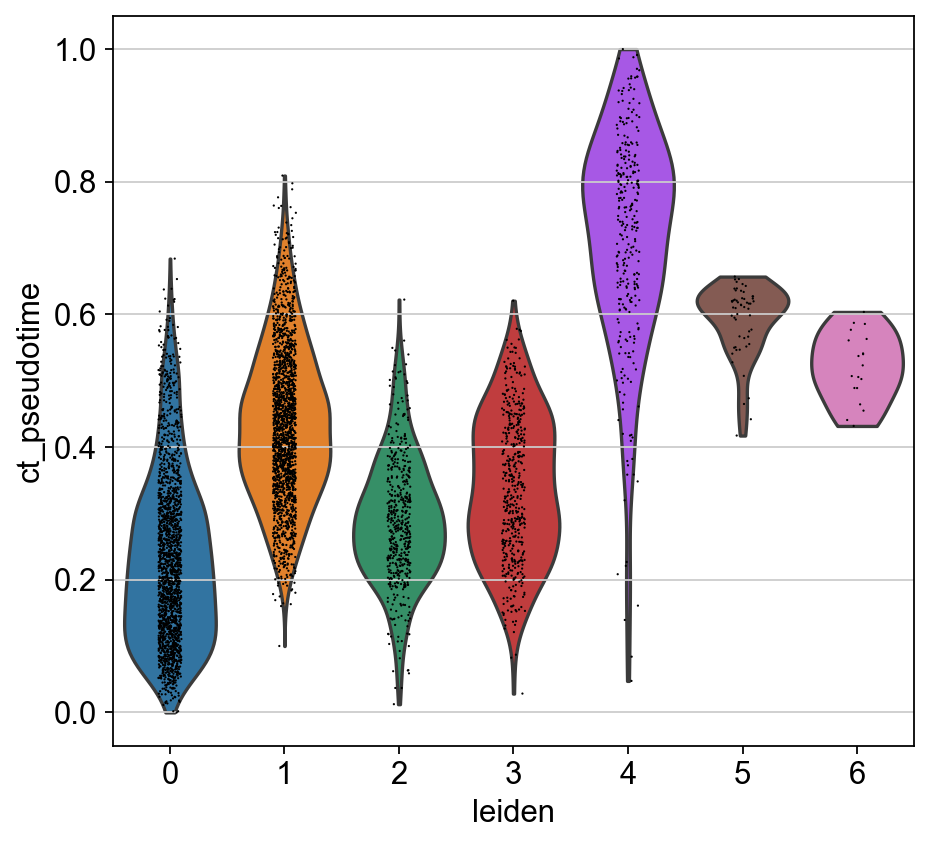

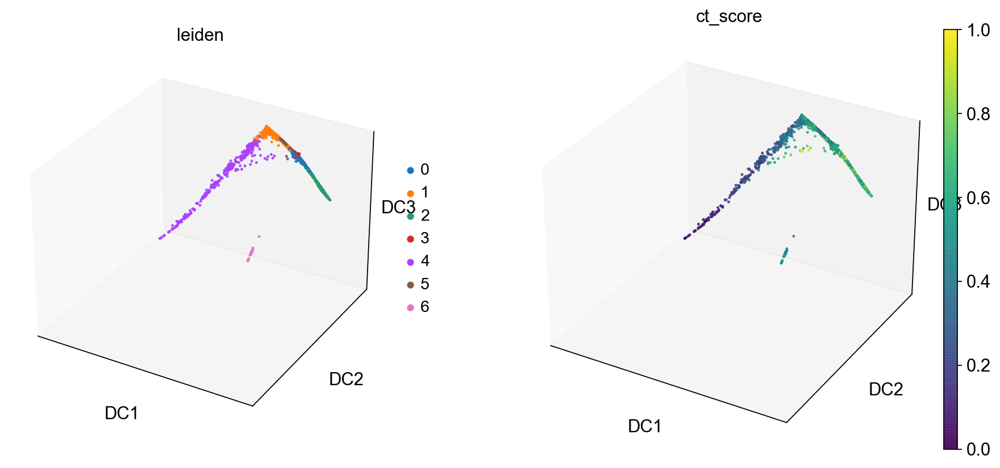

In [29]:
comparePlots(ad4X)

Cytotrace assigns pdt across a large range for each individual cluster. We can see this when we compare the violin plots. On average, ct assigns higher pdts for clusters 0-5. But with cluster 6, we can see that dpt assigns much higher pdts for those cells. The first plot supports what we see in the violin plots as the cytotrace plot has a wider range of colors. But both plots are darkest at their right tip and get lighter as we move toward the left tip. This change is much less prominent in the dpt plot though.

In [73]:
ad4X.obs

,sampleName,n_genes_by_counts,total_counts,total_counts_ribo,pct_counts_ribo,total_counts_mt,pct_counts_mt,n_counts,ct_num_exp_genes,ct_score,ct_pseudotime,leiden,pluri_genesets,dpt_pseudotime
AAACATACCCTACC-1,mEB_day4,1212,2238.0,629.0,28.105453,28.0,1.251117,1510.0,1130,0.331352,0.668648,1,-0.252571,0.223420
AAACATACGTCGTA-1,mEB_day4,1588,3831.0,1267.0,33.072304,34.0,0.887497,2448.0,1502,0.601258,0.398742,0,0.801745,0.156723
AAACATACTTTCAC-1,mEB_day4,1538,3381.0,961.0,28.423544,2.0,0.059154,2391.0,1455,0.769396,0.230604,0,0.825891,0.158202
AAACATTGCATTGG-1,mEB_day4,1221,2489.0,750.0,30.132584,24.0,0.964243,1672.0,1138,0.334012,0.665988,4,-0.209786,0.244943
AAACATTGCTTGCC-1,mEB_day4,2661,9510.0,3132.0,32.933754,71.0,0.746583,6238.0,2568,0.759986,0.240014,1,-0.318193,0.172366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGACTCTT-1,mEB_day4,2941,11419.0,4406.0,38.584812,44.0,0.385323,6784.0,2849,0.801533,0.198467,0,0.065289,0.157310
TTTGACTGAGGCGA-1,mEB_day4,2446,6908.0,1999.0,28.937466,65.0,0.940938,4810.0,2355,0.728594,0.271406,1,-0.155138,0.186487
TTTGACTGCATTGG-1,mEB_day4,2906,9558.0,3067.0,32.088303,91.0,0.952082,6157.0,2814,0.673382,0.326618,2,1.624955,0.022844
TTTGACTGCTGGAT-1,mEB_day4,1475,3280.0,1035.0,31.554878,22.0,0.670732,2113.0,1389,0.671751,0.328249,2,0.574252,0.111283


## Relationship between CT and PT across different cell types aka clusters

In [80]:
# to do this we can plot a scatter plot with dpt pdt on the x-axis and ct pdt on the y-axis for each cluster 
def celltypeScatter(anndata):
    for label in np.sort(anndata.obs['leiden'].unique()):
        sc.pl.scatter(anndata[anndata.obs['leiden'] == label], x = 'dpt_pseudotime', y = 'ct_pseudotime', title = label)

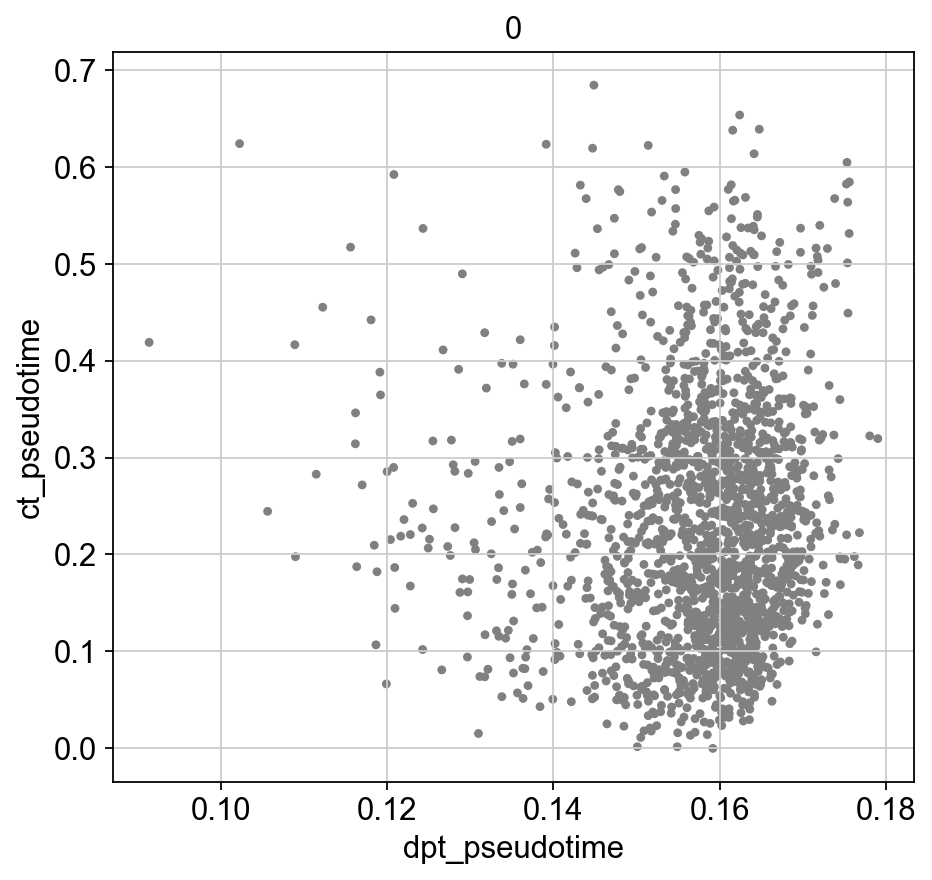

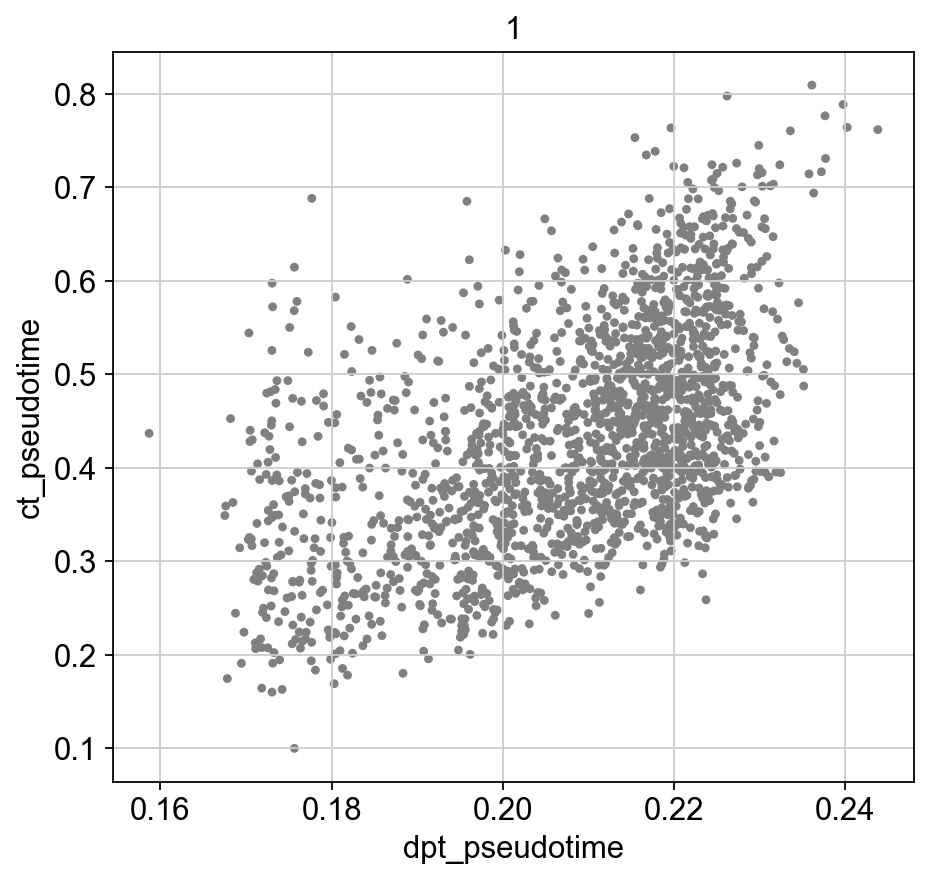

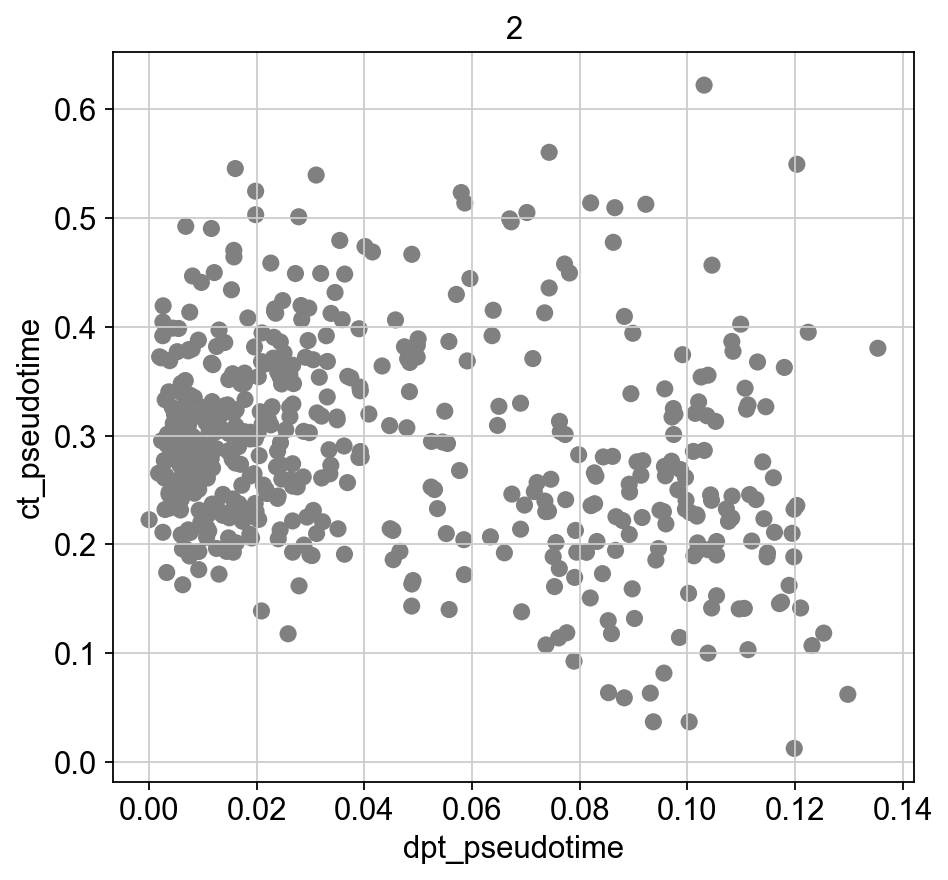

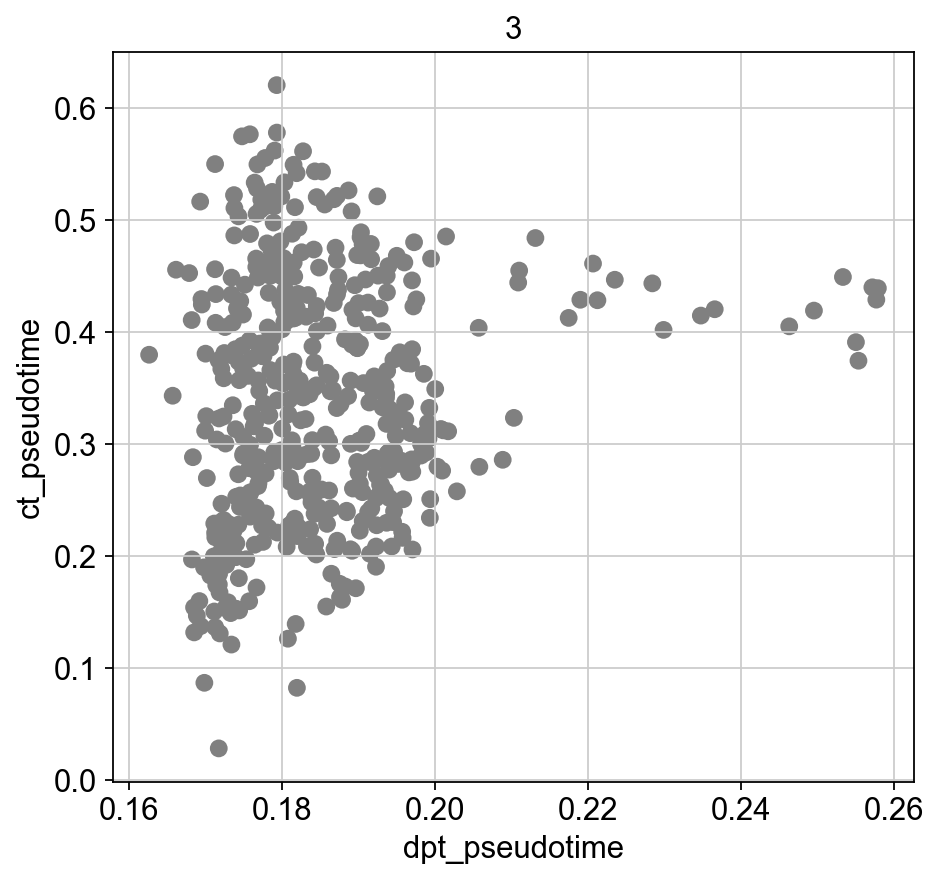

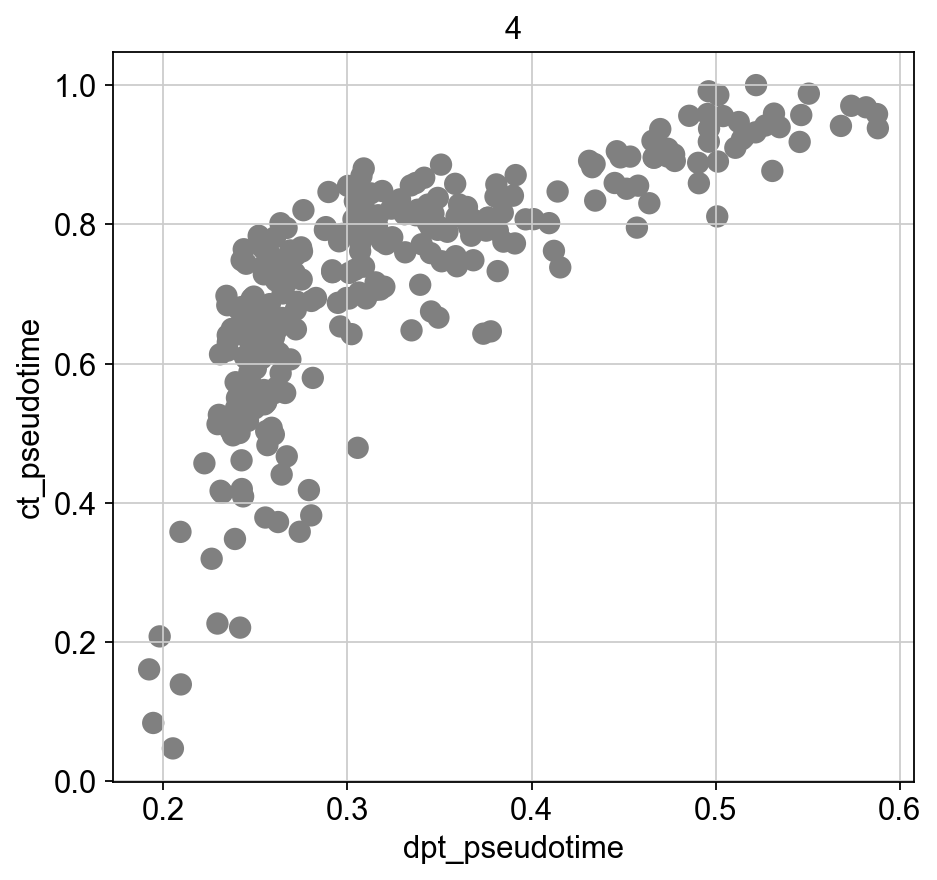

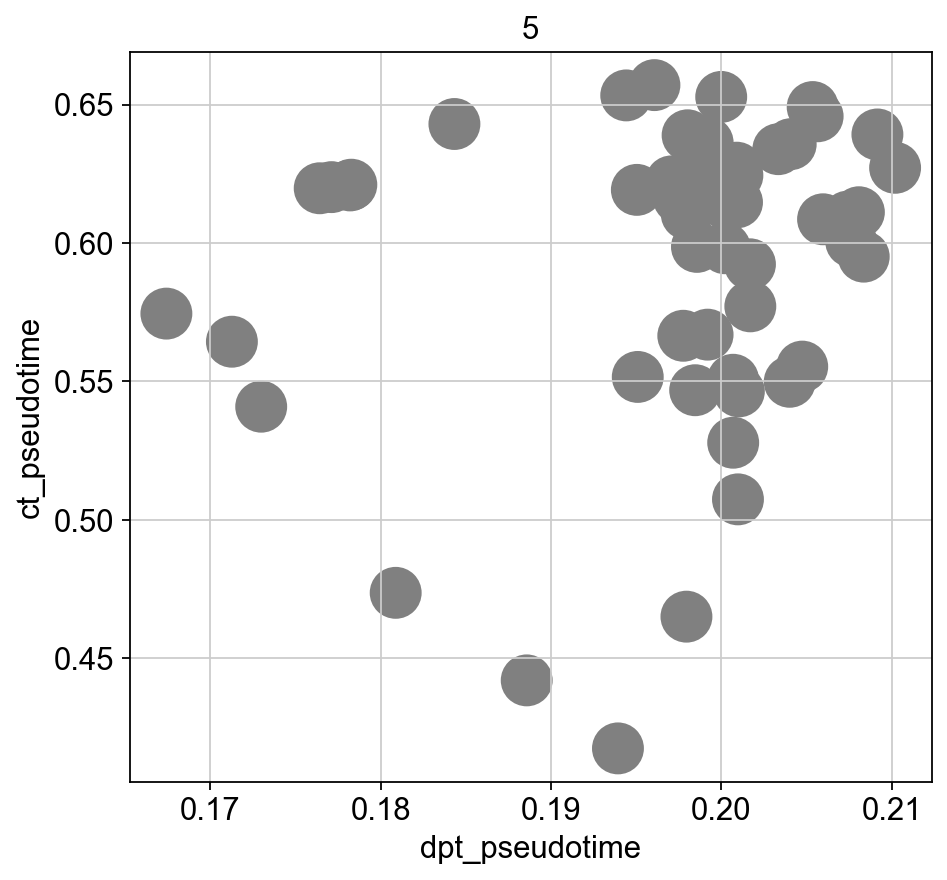

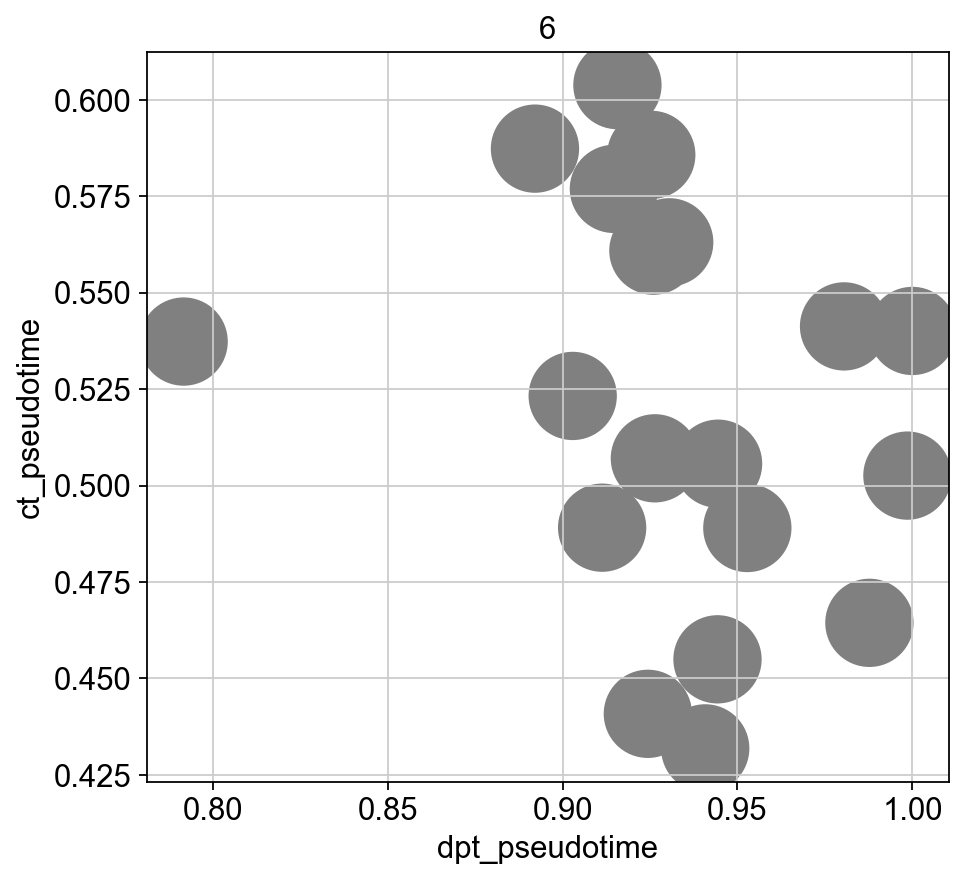

In [81]:
# plot relationship between dpt pseudotime and ct pseudotime for all celltypes/clusters
celltypeScatter(ad4X)

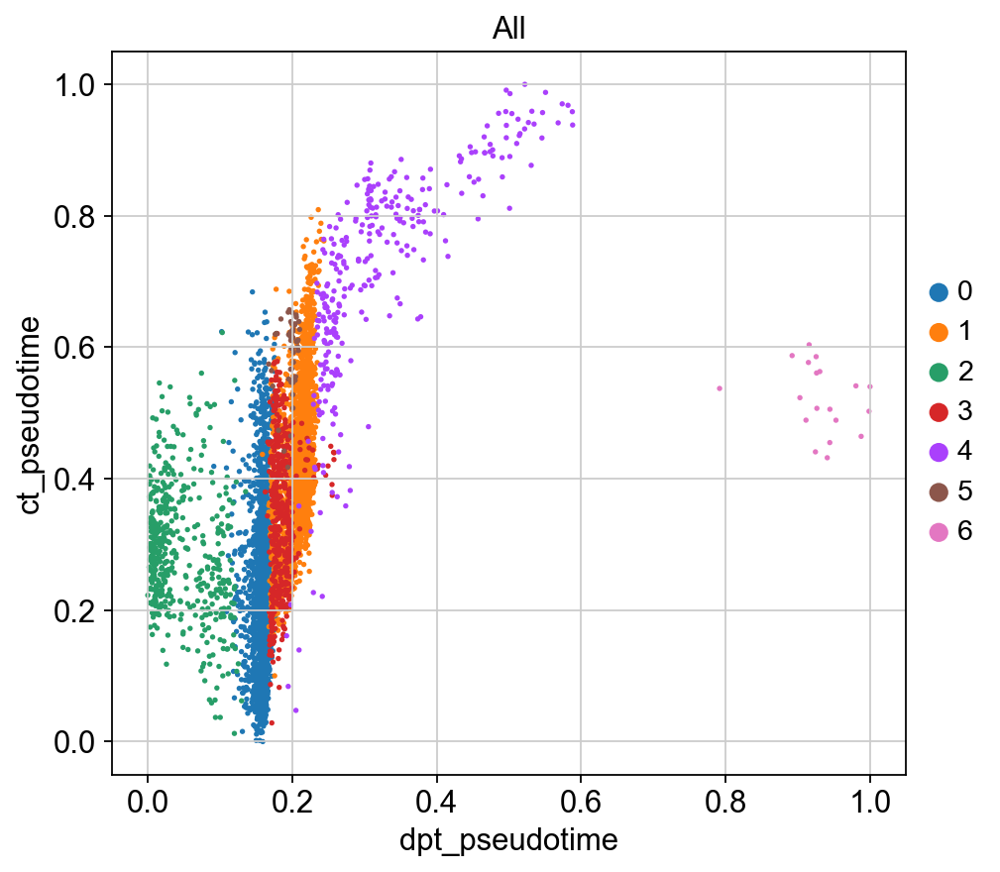

In [85]:
# scatter with all clusters colored by cluster
sc.pl.scatter(ad4X, x = 'dpt_pseudotime', y = 'ct_pseudotime', title = 'All', color = 'leiden')

We can use these scatter plots to look at how the two different methods vary when assigning pdt. A straight line from the bottom left corner to the top right corner represents the locations where the two methods would assign the same pdt (y=x) (also if axes are equal). In the scatter with all the cell types we can see a clear seperation between most of the clusters. For example, with cluster 0, we can see that ct varies alot more for it's assignments of pdt than dpt as the axis range is much greater than the x axis. These scatter plots plot what we see in the violin plots but allows us to visualize the differences between ct and dpt more directly. In the scatter plot with all the clusters we can see that ct tends to vary more for 0-3 + 5, while dpt varies more for cluster 4. In this plot we can also see more overlap of the assigned pdts with ct than dpt. 

## Repeat with 0-4 data

In [30]:
# filter out rare genes and norm
adNorm = filterRareGenes_norm(adata)

In [31]:
# apply the hack from lecture
hack(adNorm)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [32]:
ctk = CytoTRACEKernel(adNorm)

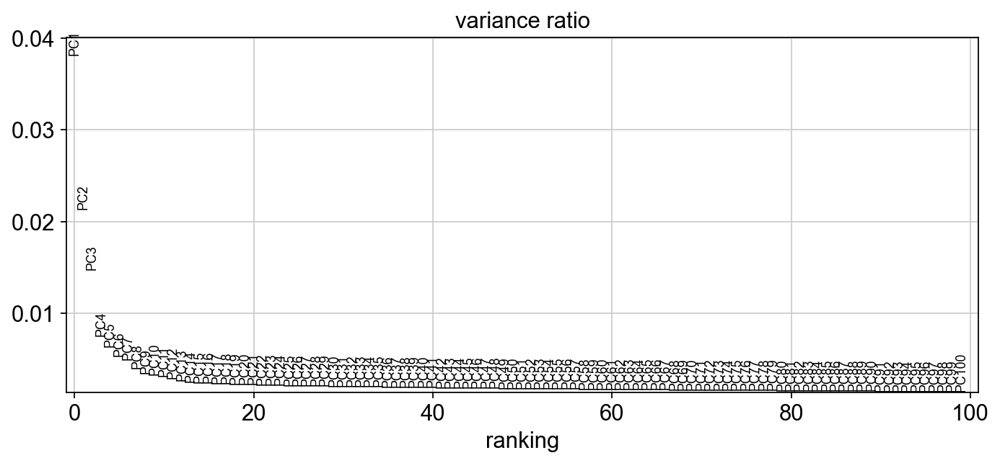

In [33]:
scalePCA(adNorm)

In [34]:
compLeiden(adNorm)

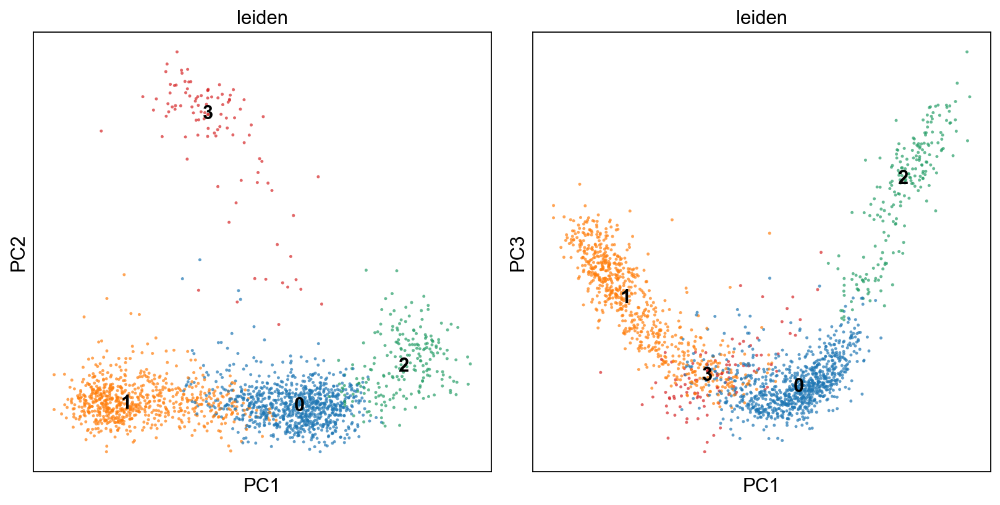

In [35]:
plotLeiden(adNorm)

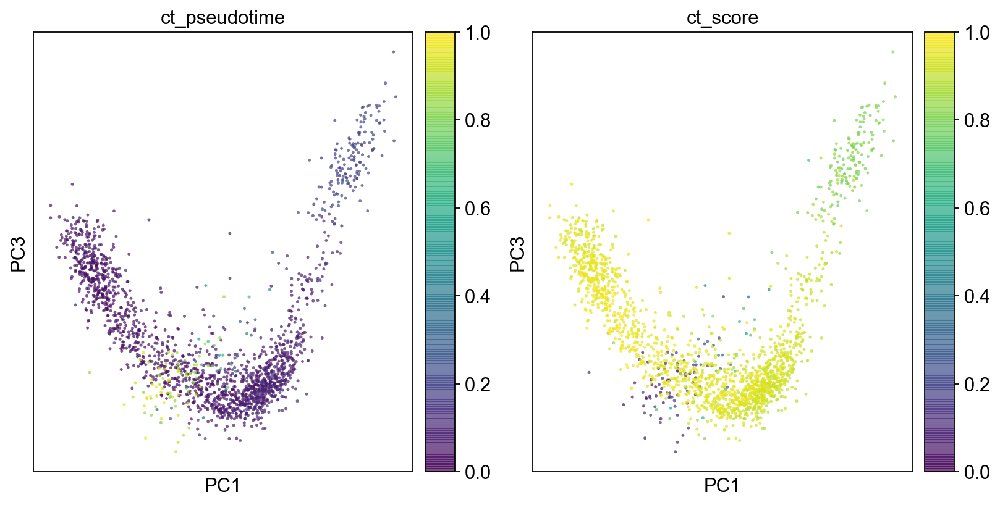

In [36]:
plotLeidenPDT(adNorm)

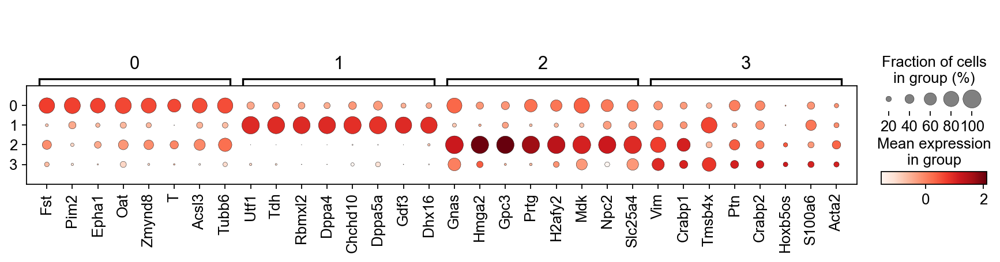

In [37]:
rankGenes_dpt(adNorm)
# looks like we should drop cluster 3

In [38]:
# # remove cluster 3
# adX = adNorm[adNorm.obs['leiden'] != "3"].copy()

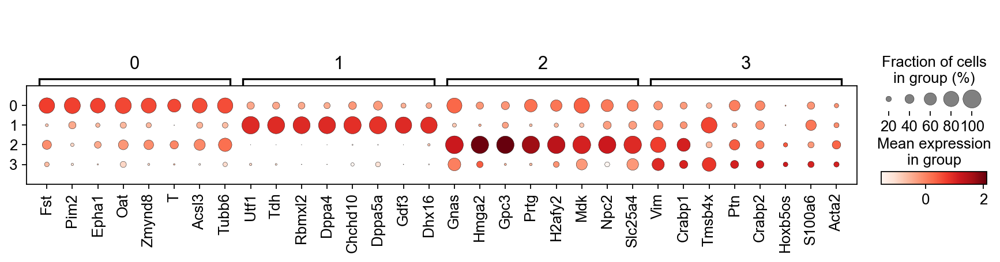

In [39]:
# replot dotplot 
adX = adNorm
rankGenes_dpt(adX)

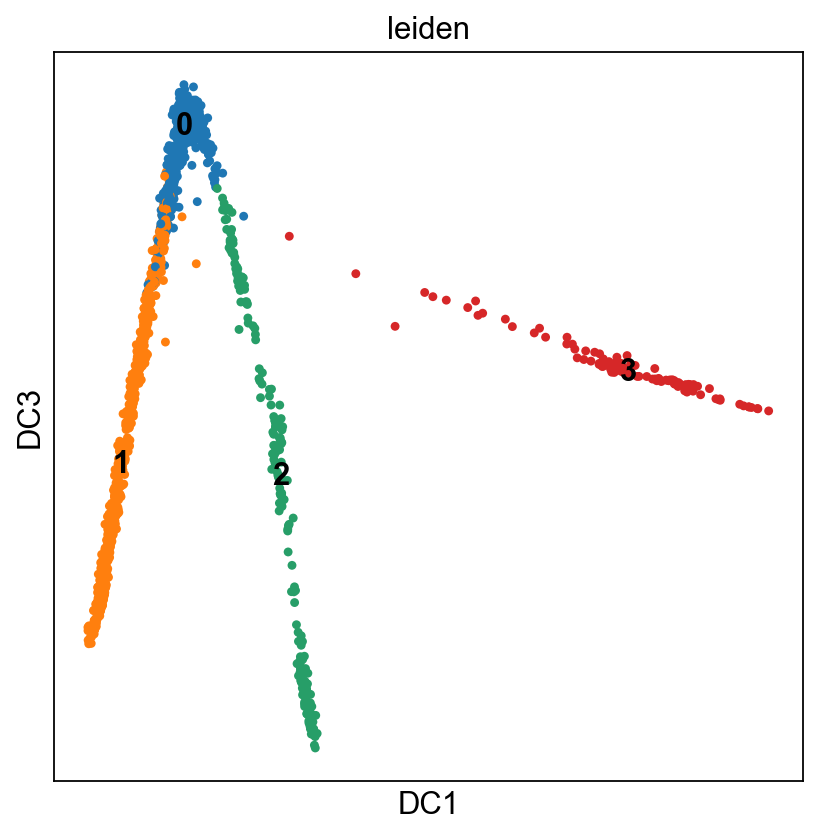

In [40]:
diffMap(adX)

In [41]:
# call our find root function 
findRoot(adX)

        pluri_genesets
leiden                
0            -0.133759
1             0.394794
2            -0.690300
3            -0.146121


In [42]:
# define the root 
# we will choose cluster 1 was the root since it has the highest mean expression of pluri genes
adX.uns['iroot'] = np.flatnonzero(adX.obs['leiden']  == '1')[0]

sc.tl.dpt(adX)

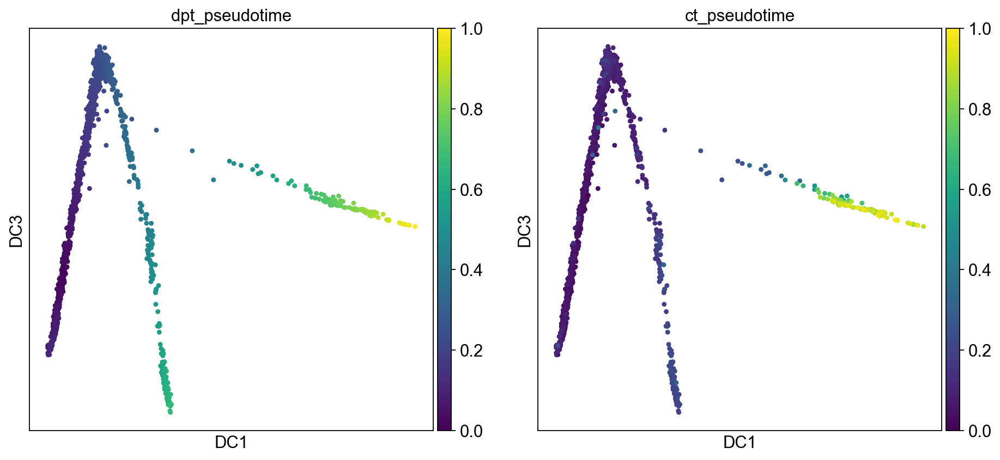

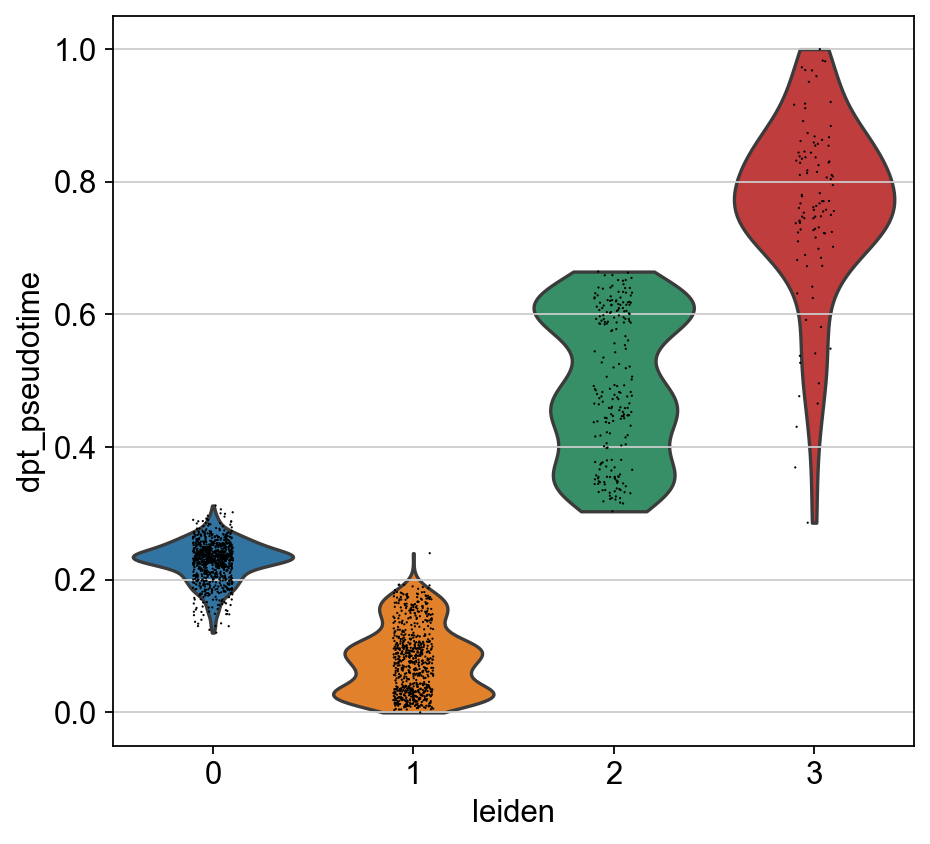

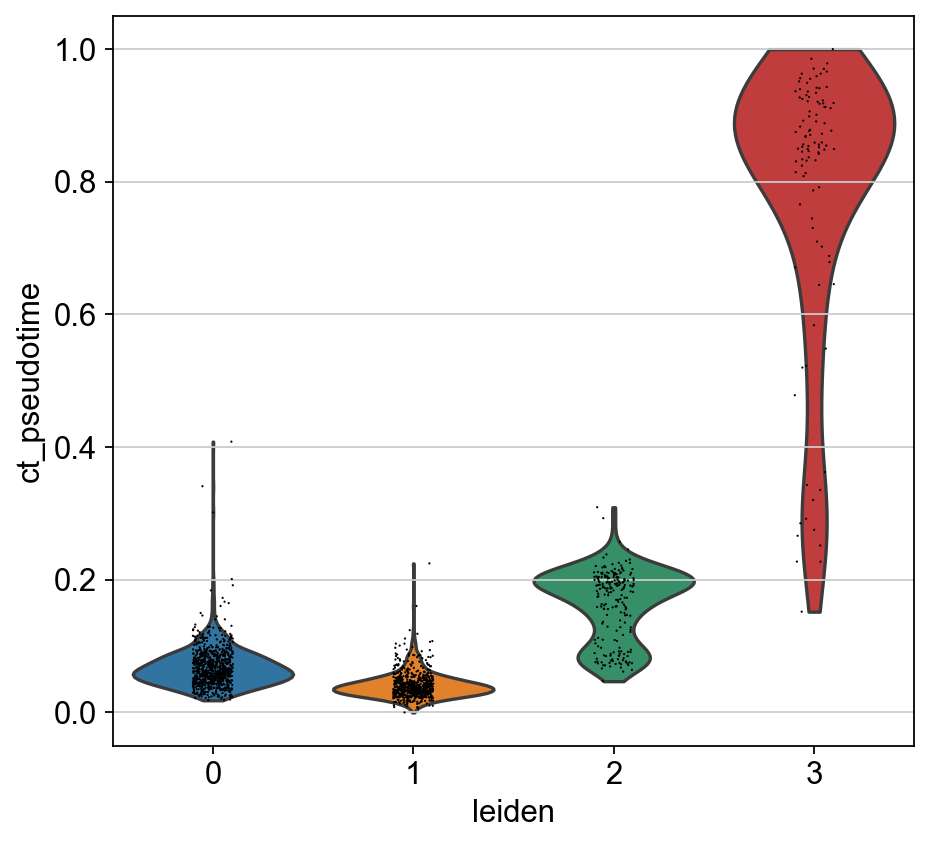

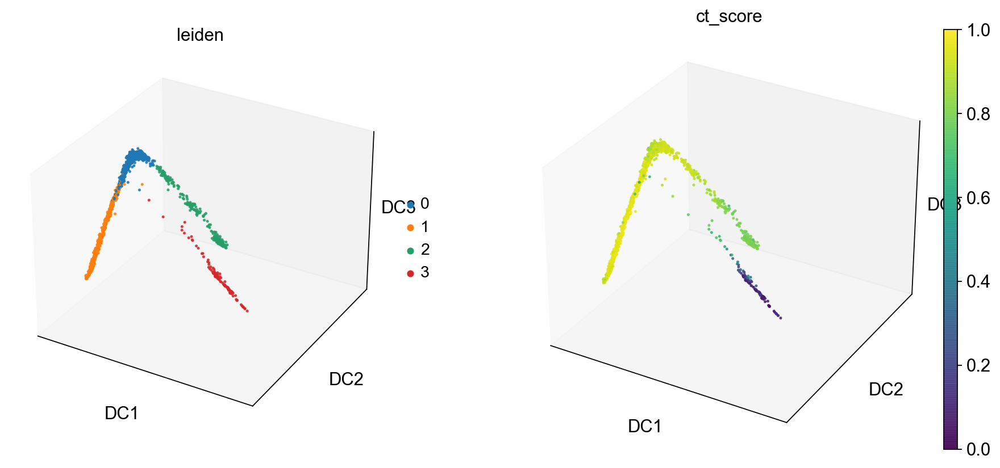

In [43]:
comparePlots(adX)

With this dataset, dpt and ct plots look more similar. The difference in range seen in the violin plots does not vary as much as with the first dataset. But we can see that ct scores the majority of cells in cluster 0 lower than dpt. This is also the case with cluster 2 as ct pdt assignments are about half of what they are in dpt. The majority of cells in cluster 3 are scored slightly higher in ct than dpt though. In first plot, the leftmost and right most branches are colored quite similarily. Only the middle branch looks varied between the two. Although the right two branches both seem to get lighter as we move away from the top left corner in both plots, this change is barely visible in ct. ct is also darker at the point where all the branches meet. 

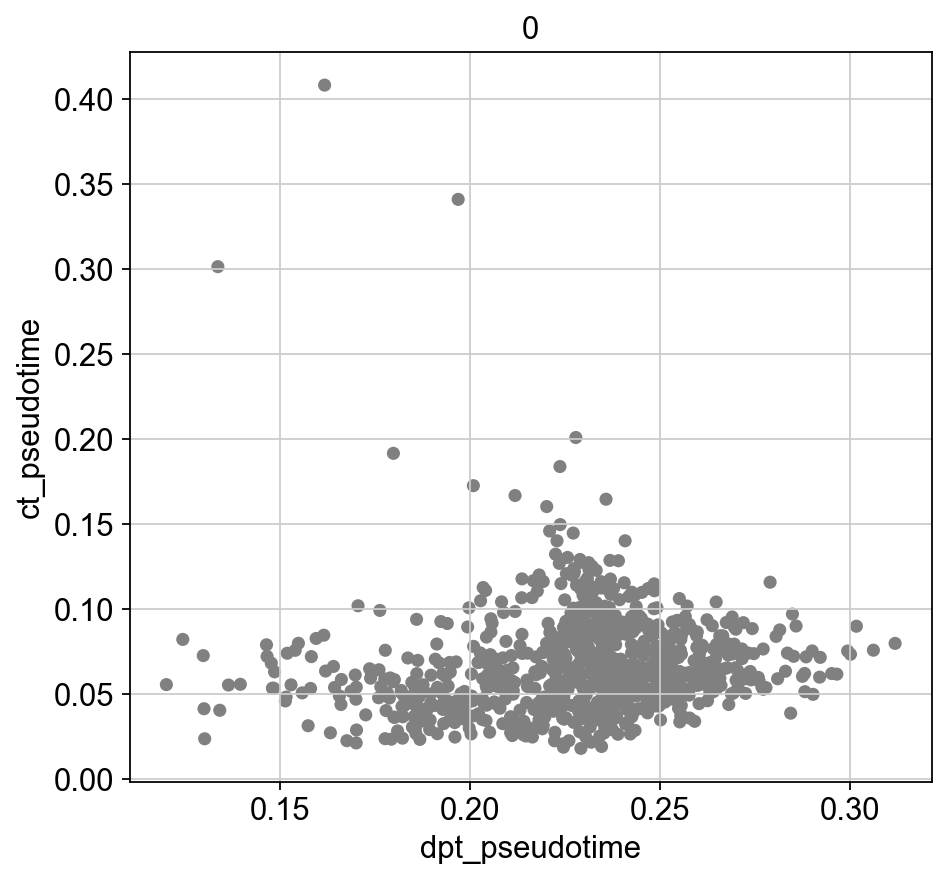

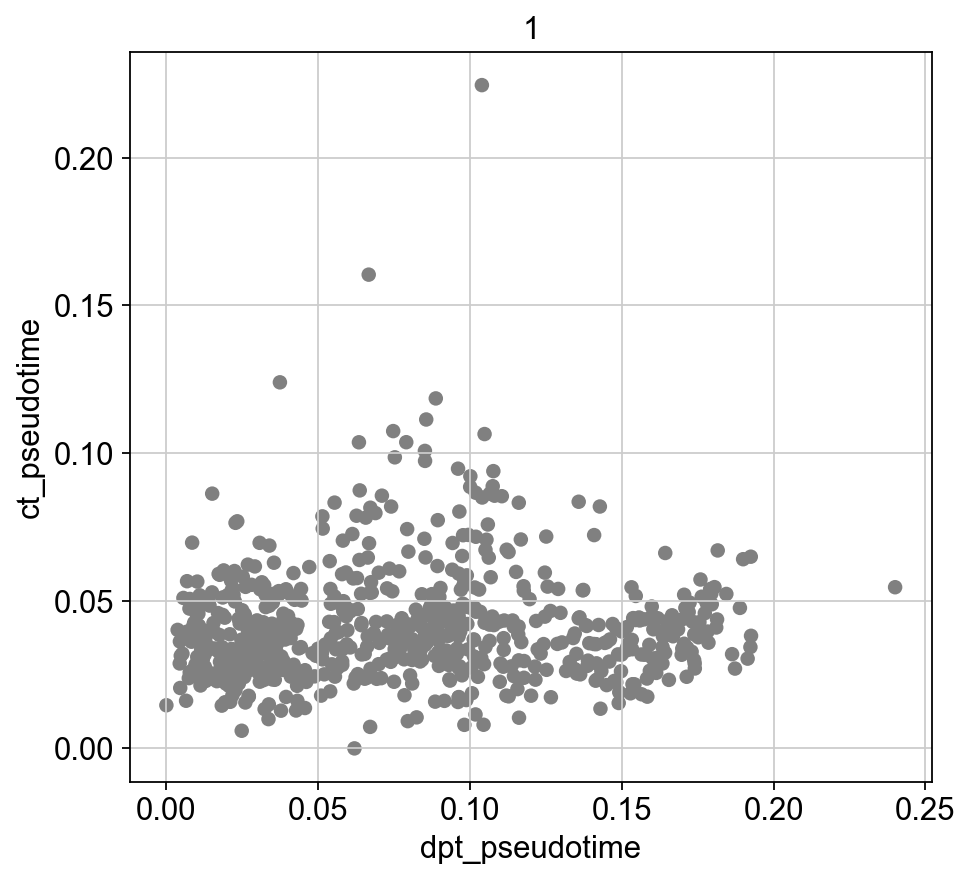

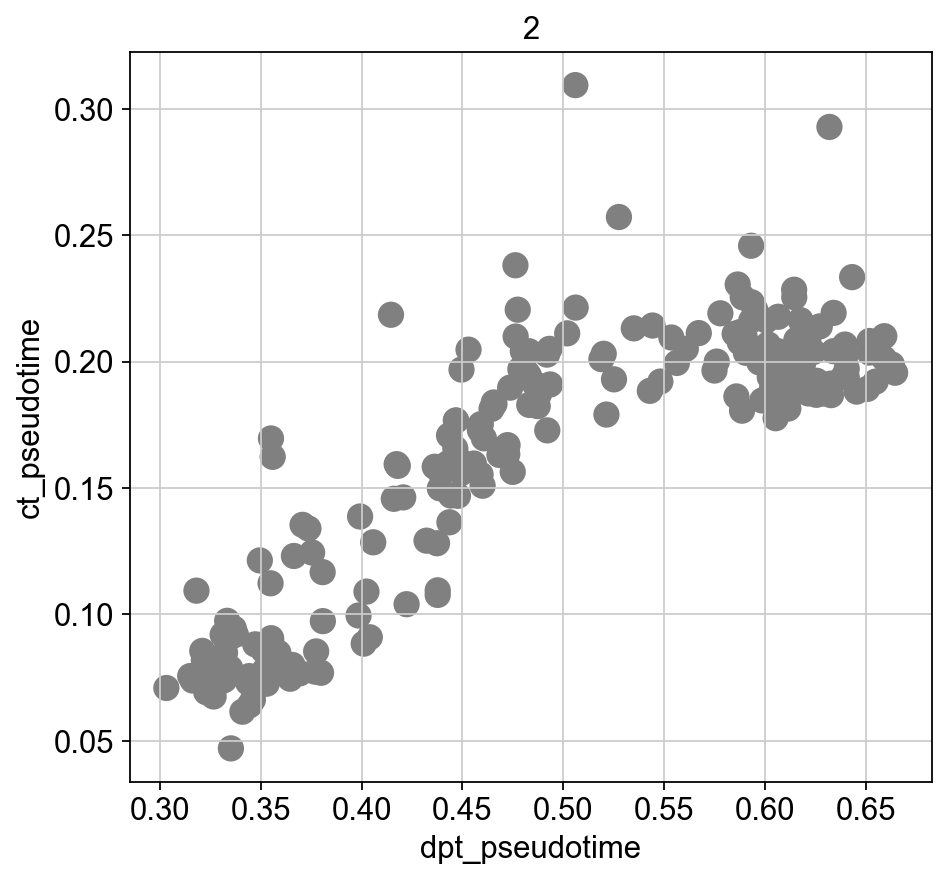

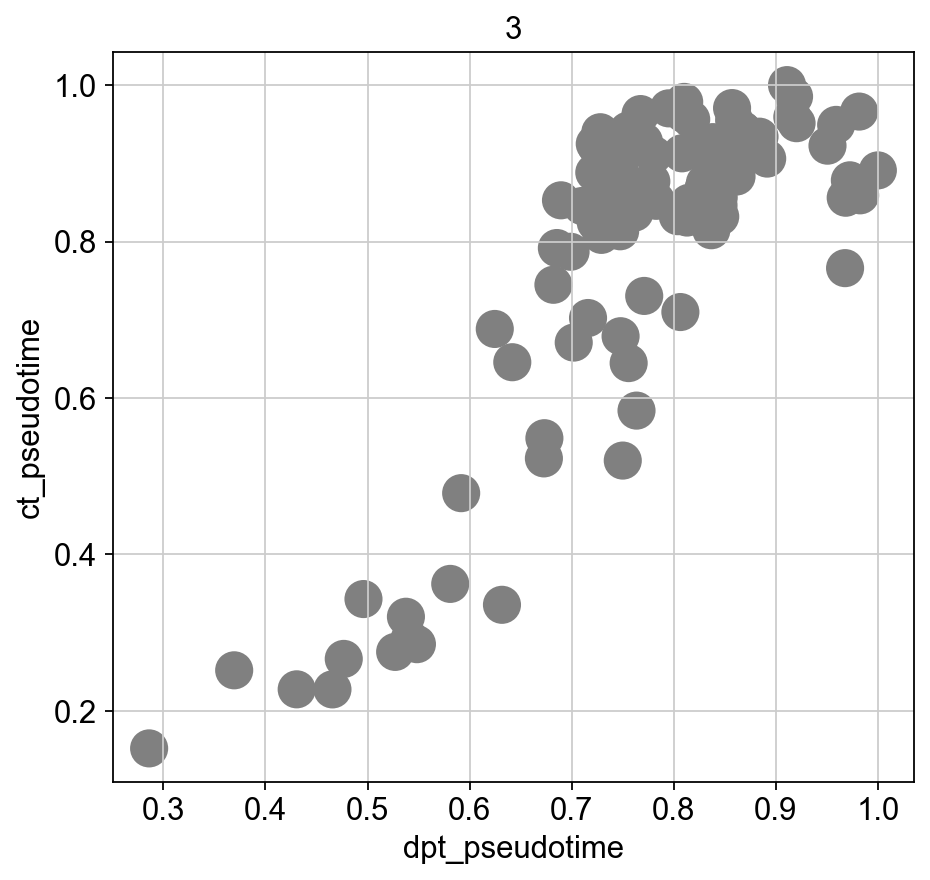

In [82]:
# next lets look at ct and pt differences acroess cell types using our function
celltypeScatter(adX)

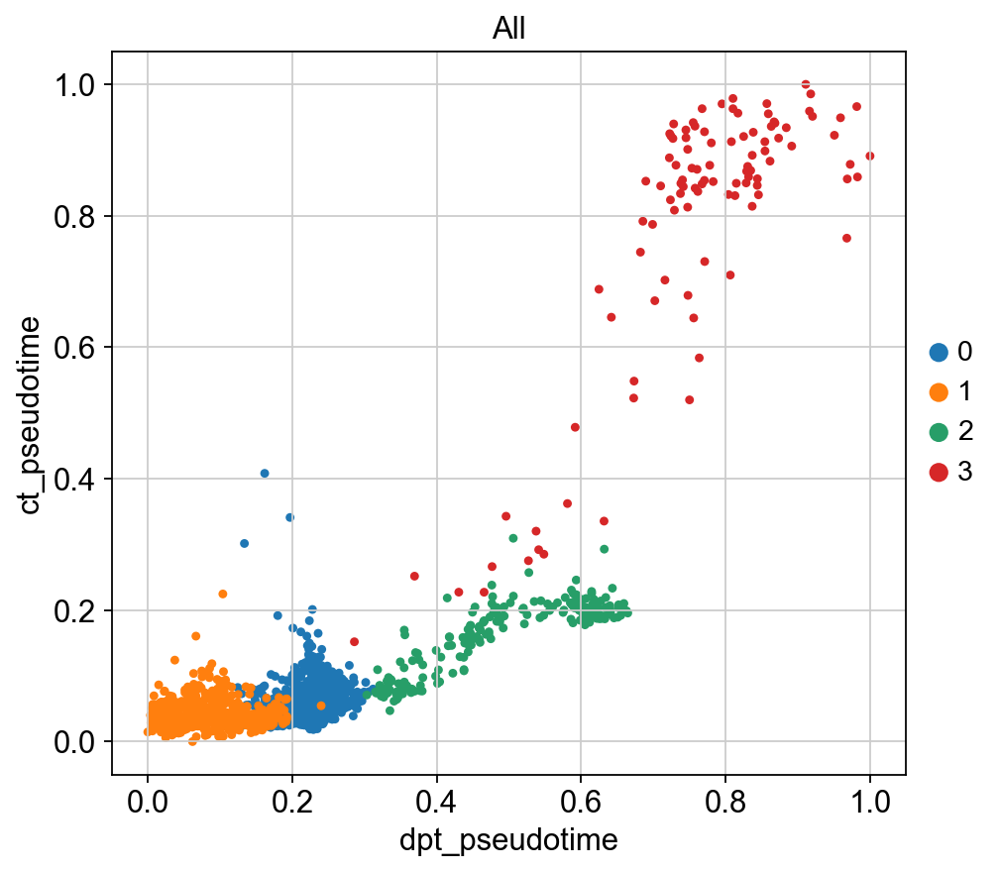

In [86]:
# scatter with all clusters colored by cluster
sc.pl.scatter(adX, x = 'dpt_pseudotime', y = 'ct_pseudotime', title = 'All', color = 'leiden')

Here, in the scatter plot with all cell types, we can see a more linear relationship than the previous dataset. Although it is not perfect, as each cluster moves along each axis it increases in the other. This trend is also quite visible in the plot for cluster 3. For cluster one we can see that dpt varies more than ct. This was also seen the violin plots. Cluster 2 has bigger differences in y vs x range which validates the differences we see the in the violin plots. In the cluster 0 plot we can see that the majority of cells in a pretty close range, ct assigns a few outliers.

### Bonus mission:

You wonder whether the overall trends that you have observed with the differentiating mESCs extend to other lineages. Therefore, you decide to perform a similar analysis using the young and old HSC data from HW3. 

### Option 2, whole datasets

In [44]:
adYoung = sc.read_h5ad('adYoungHSC_03022022.h5ad')
adOld = sc.read_h5ad('adOldHSC_03022022.h5ad')

In [45]:
# view ribo, mt, totalcountvsngenesbycounts for to pick thresholds for what to remove
def preProcess_view(anndata):
    anndata.var['mt']= anndata.var_names.str.startswith(("mt-"))
    anndata.var['ribo'] = anndata.var_names.str.startswith(("Rps","Rpl"))
    sc.pp.calculate_qc_metrics(anndata, qc_vars=['ribo', 'mt'], percent_top=None, log1p=False, inplace=True)
    axs = sc.pl.violin(anndata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],jitter=0.4, multi_panel=True)
    sc.pl.scatter(anndata, x='total_counts', y='n_genes_by_counts')

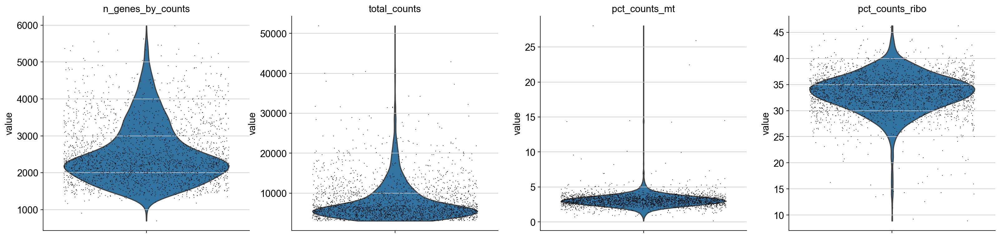

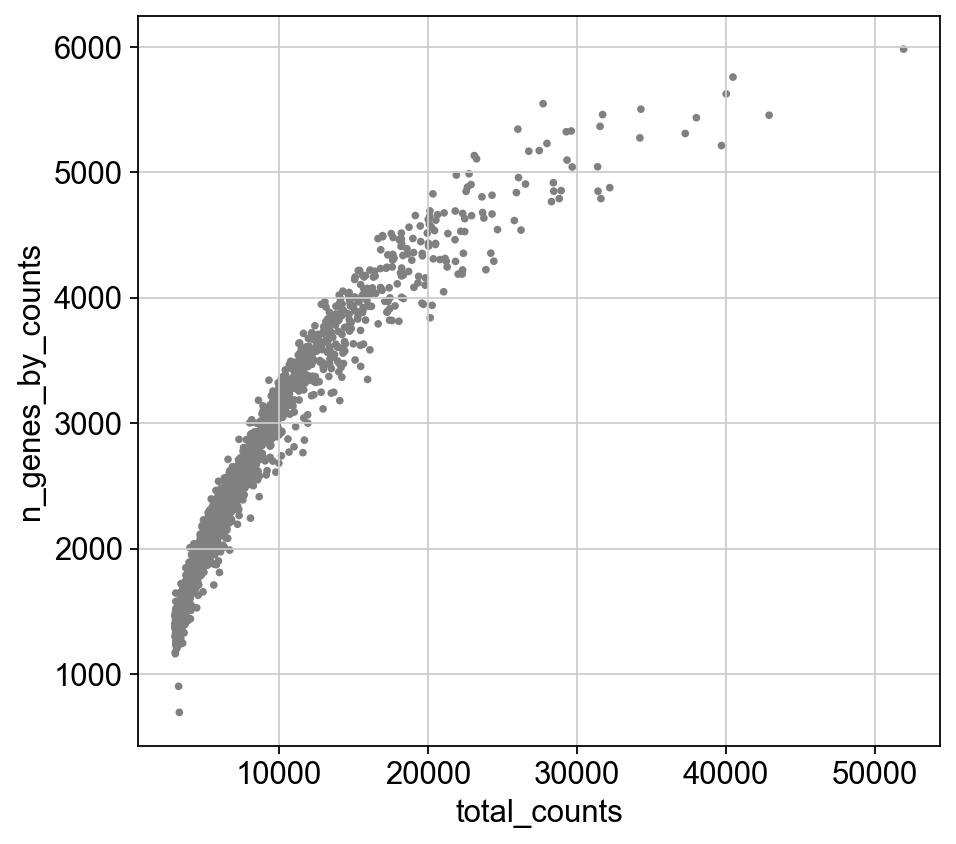

In [46]:
preProcess_view(adYoung)

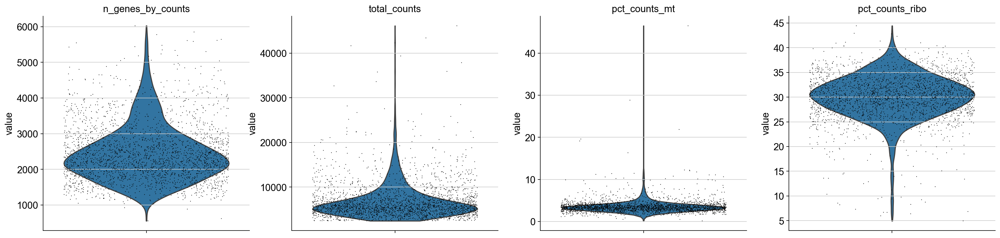

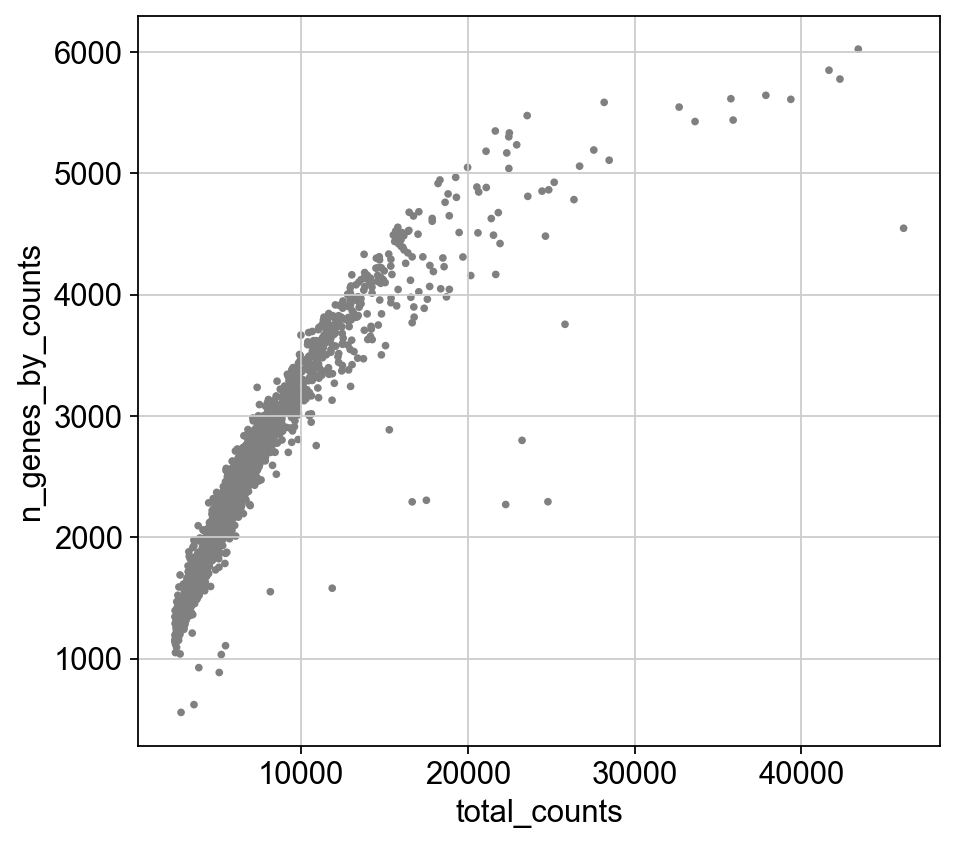

In [47]:
preProcess_view(adOld)

In [48]:
# actually preprocess the data
def preProcess(anndata):
    # only mt and total count look like they have some value that are too high so lets remove them
    # try to target the excess 'tips'
    adata_filt = anndata[anndata.obs['total_counts'] < 50000, :]
    adata_filt = anndata[anndata.obs['pct_counts_mt'] < 10, :]
    adata_filt = anndata[anndata.obs['pct_counts_ribo'] < 50, :]
    
    # remove doublets
    thresh = np.percentile(adata_filt.obs['total_counts'],95) 
    adata_filt = adata_filt[adata_filt.obs['total_counts'] < thresh, :]
    
    # remove bad genes 
    mito_genes = adata_filt.var_names.str.startswith('mt-')
    ribo_genes = adata_filt.var_names.str.startswith(("Rpl","Rps"))
    malat_gene = adata_filt.var_names.str.startswith("Malat1")

    remove = np.add(mito_genes, ribo_genes)
    remove = np.add(remove, malat_gene)
    keep = np.invert(remove)

    adata_filt = adata_filt[:,keep].copy()
    
    # remove rare genes and norm
    filterRareGenes_norm(adata_filt)
    
    return adata_filt

In [49]:
adYoung_filt = preProcess(adYoung)
adOld_filt = preProcess(adOld)

In [50]:
hack(adYoung_filt)
hack(adOld_filt)

Normalized count data: X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Normalized count data: X.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [51]:
ctkY = CytoTRACEKernel(adYoung_filt)
ctkO = CytoTRACEKernel(adOld_filt)

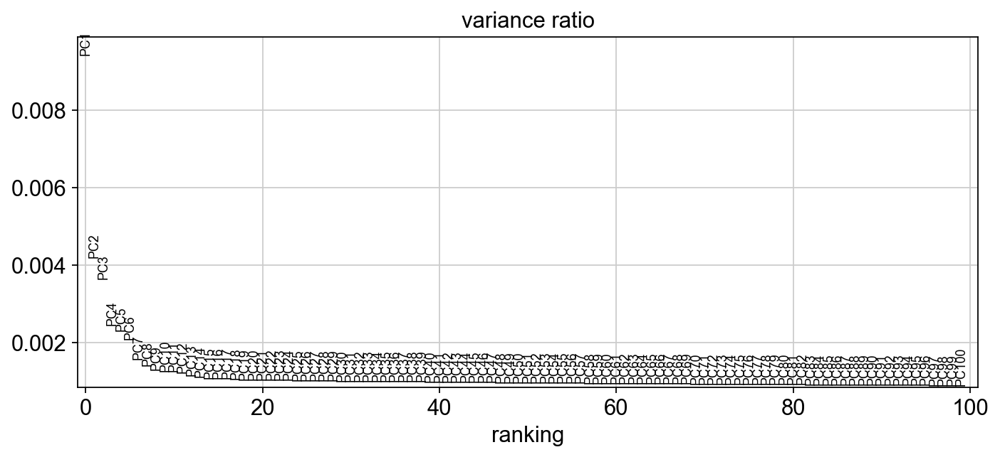

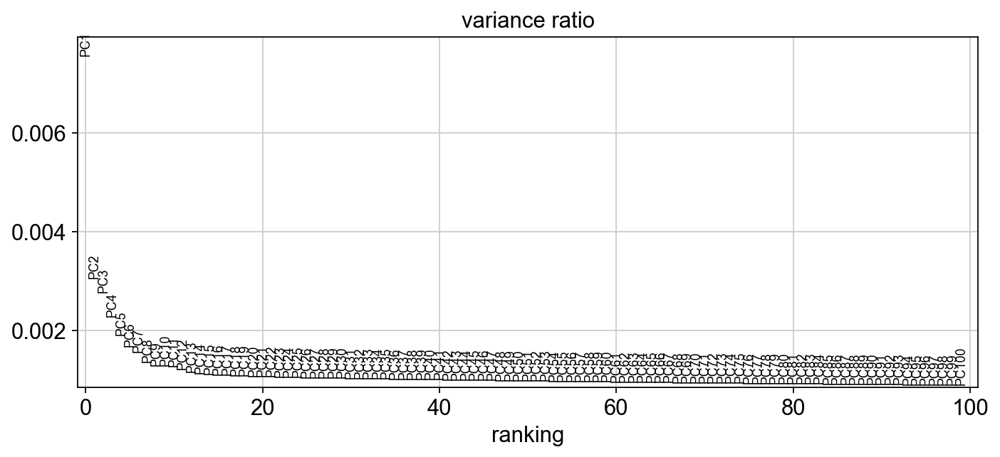

In [52]:
scalePCA(adYoung_filt)
scalePCA(adOld_filt)

In [53]:
compLeiden(adYoung_filt)
compLeiden(adOld_filt)

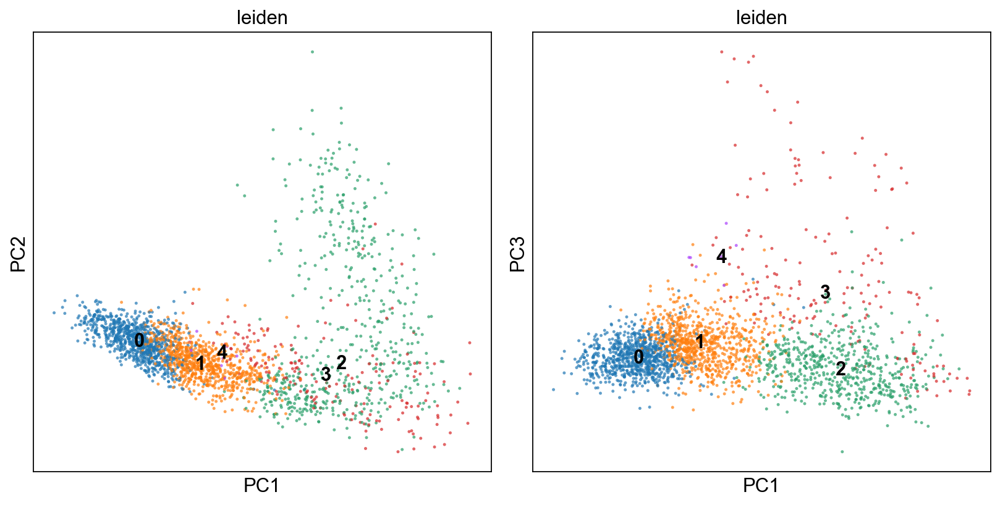

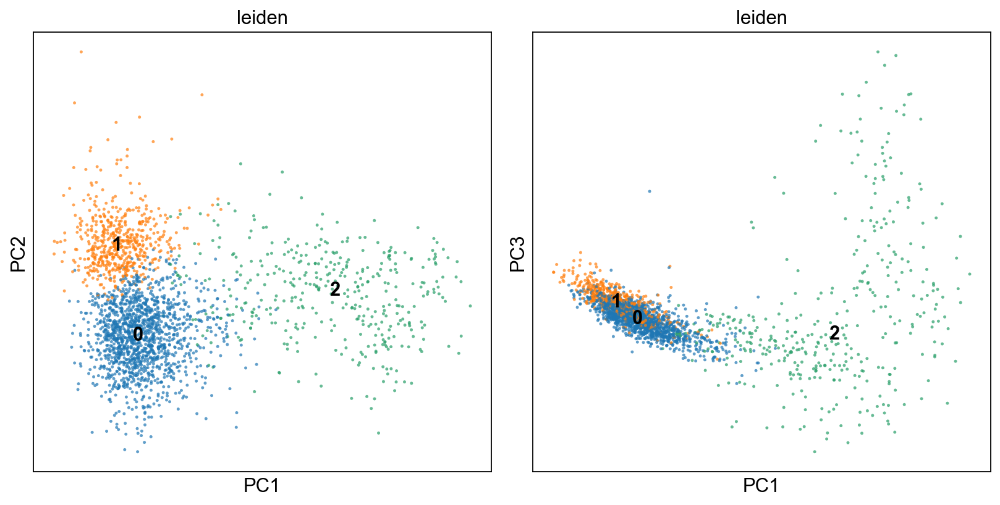

In [54]:
plotLeiden(adYoung_filt)
plotLeiden(adOld_filt)

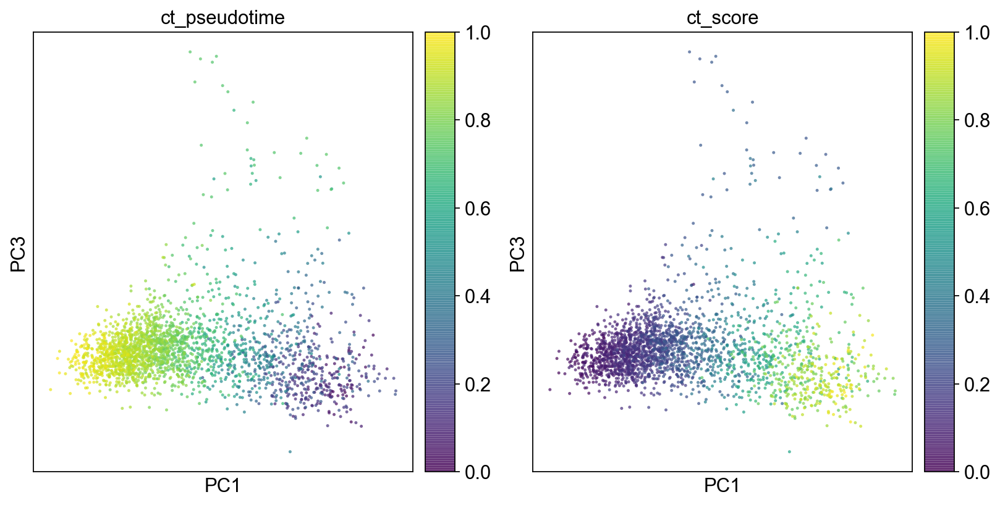

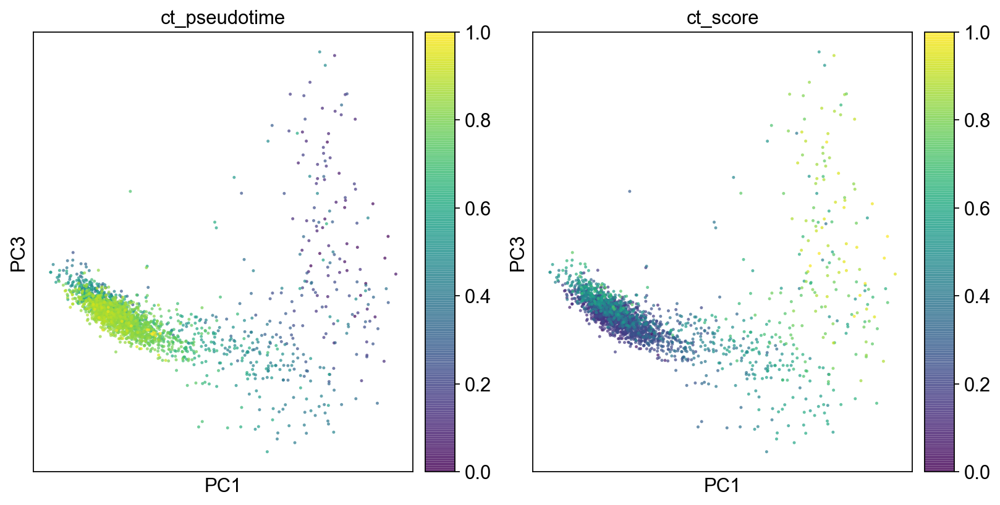

In [55]:
plotLeidenPDT(adYoung_filt)
plotLeidenPDT(adOld_filt)

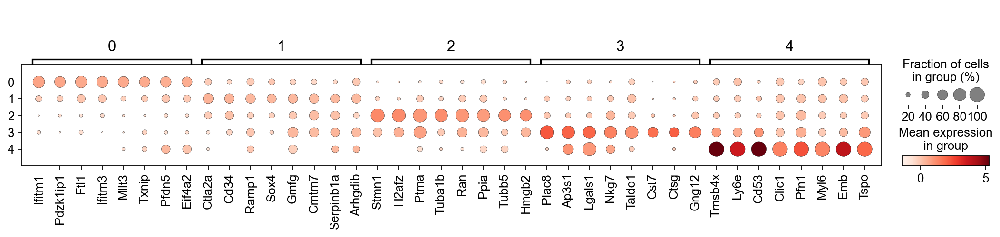

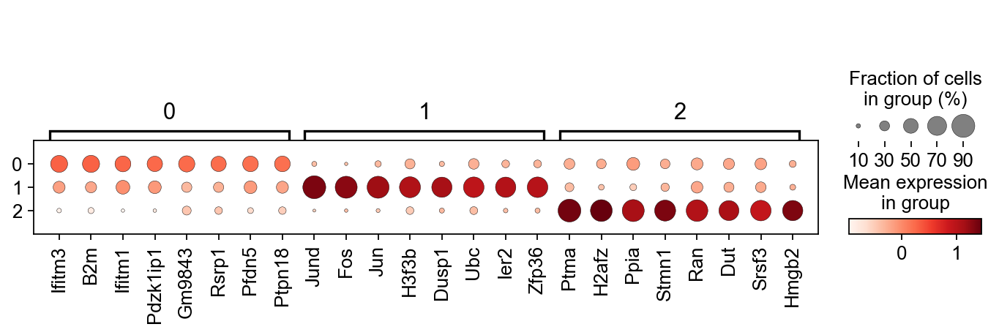

In [56]:
rankGenes_dpt(adYoung_filt)
rankGenes_dpt(adOld_filt)

In [57]:
# remove cluster 3 4
# adXYoung = adYoung_filt[adYoung_filt.obs['leiden'] != '4'].copy()
# adXYoung = adXYoung[adXYoung.obs['leiden'] != '3'].copy()

adXYoung = adYoung_filt

In [58]:
adXOld = adOld_filt.copy()

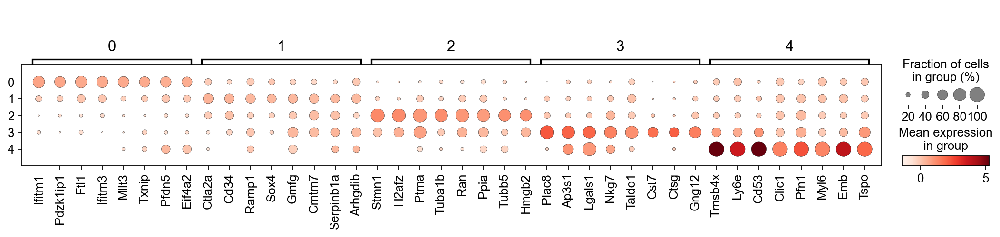

In [59]:
rankGenes_dpt(adXYoung)

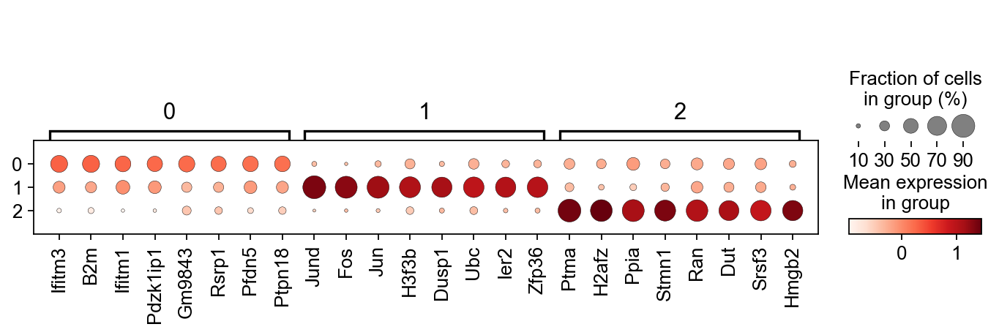

In [60]:
# replot dotplot 
rankGenes_dpt(adXOld)

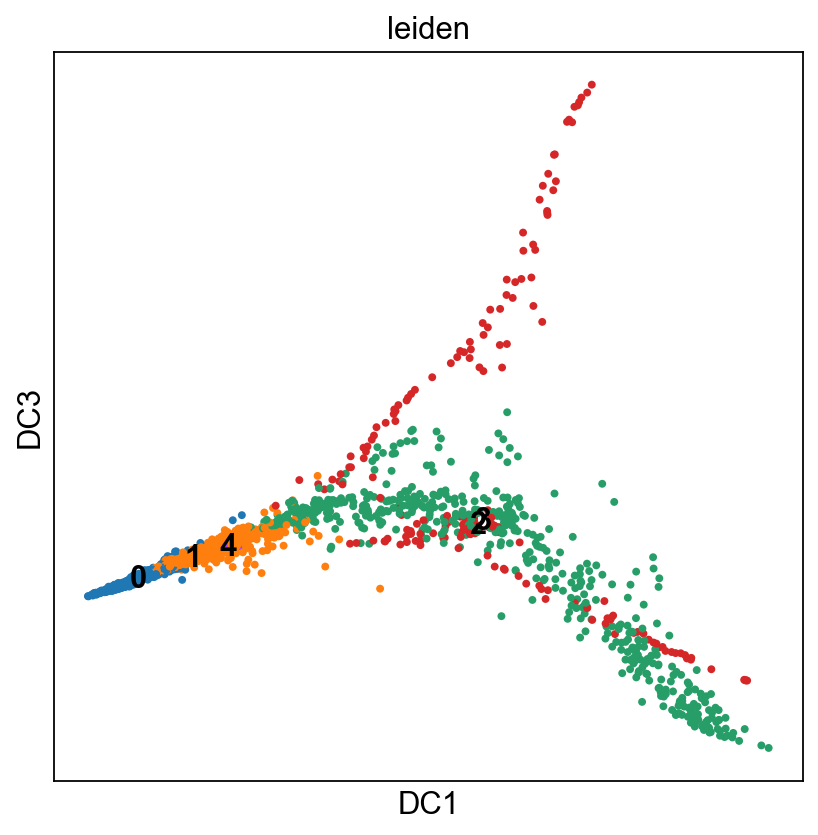

In [61]:
diffMap(adXYoung)

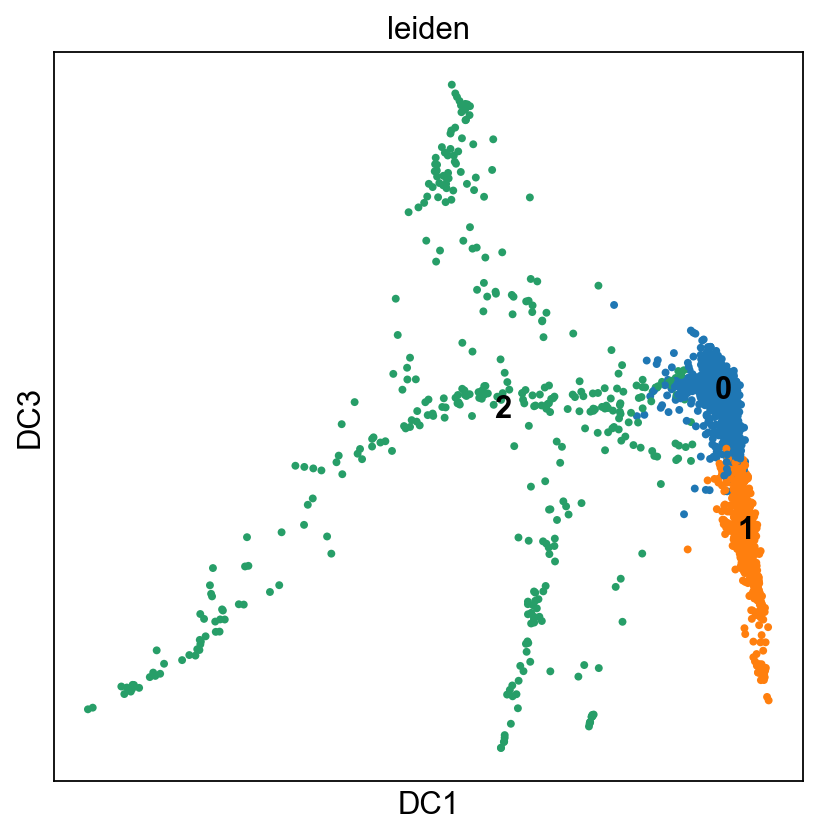

In [62]:
diffMap(adXOld)

In [63]:
# call our find root function
findRoot(adXYoung)

        pluri_genesets
leiden                
0             0.000402
1             0.018371
2             0.004366
3            -0.026812
4             0.021548


In [64]:
# define the root as 4 since it has the highest mean exp of pluri genes
adXYoung.uns['iroot'] = np.flatnonzero(adXYoung.obs['leiden']  == '4')[0]

sc.tl.dpt(adXYoung)

In [65]:
# find root for old 
findRoot(adXOld)

        pluri_genesets
leiden                
0             0.000345
1            -0.001627
2             0.010989


In [66]:
# define the root as 2 since it has the highest exp of pluri genes
adXOld.uns['iroot'] = np.flatnonzero(adXOld.obs['leiden']  == '2')[0]

sc.tl.dpt(adXOld)

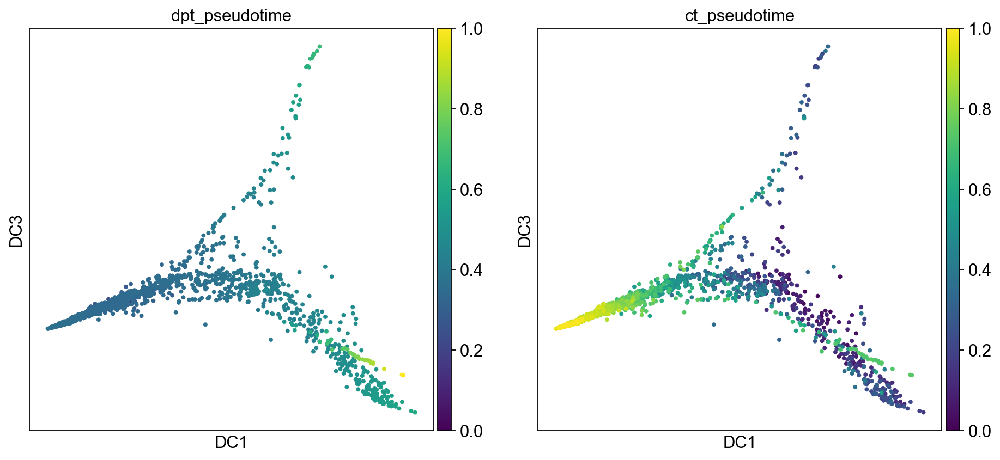

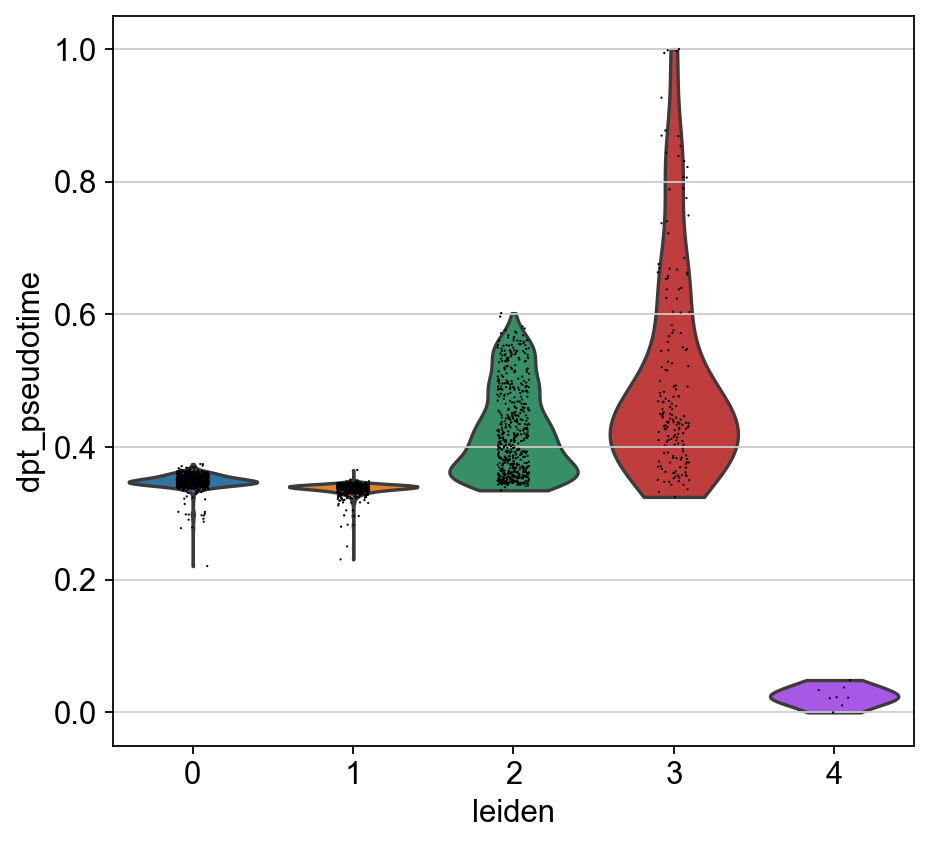

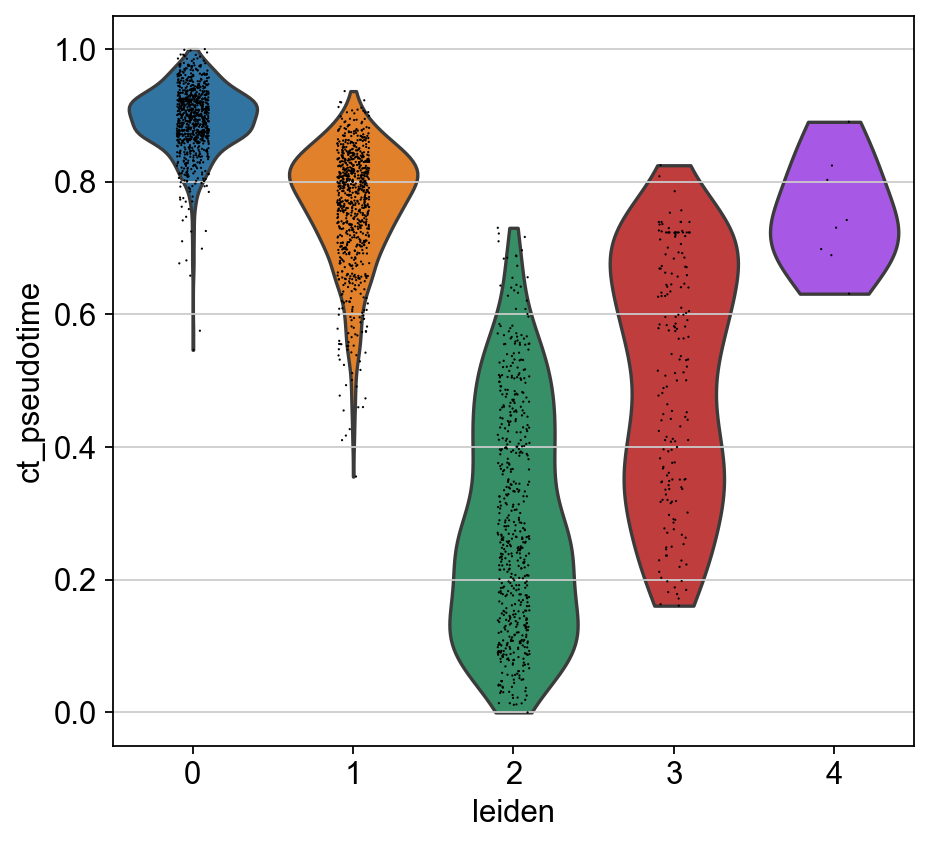

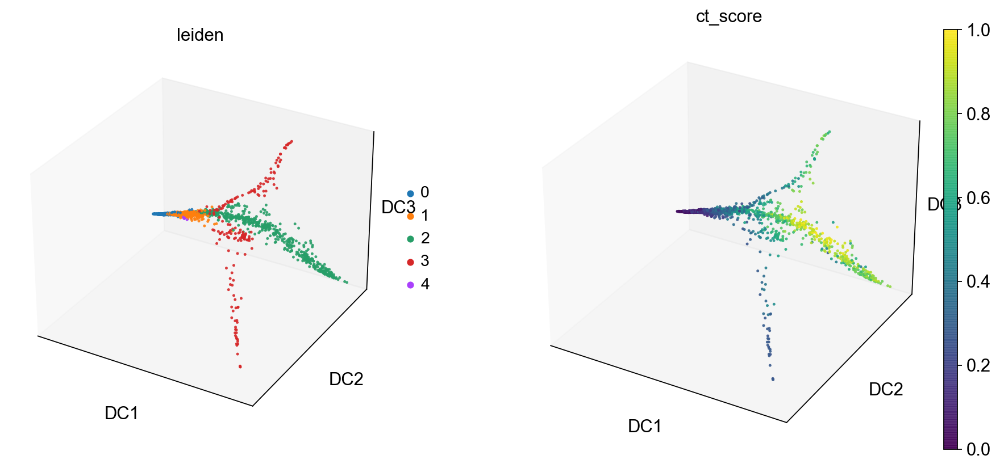

In [67]:
comparePlots(adXYoung)

# COMMENTS
In the violin plots, we can see that ct assigns 'higher' pdt's to clusters 0, 1, and 4. For cluster 3, ct assigns pdt quite evenly from .2-.8 while dpt has most around .5 and then a sharp tip towards 1. For cluster 2, ct assigns pdt across a large range (0-.7) while dpt is only from .3-.6. We can also see pretty big differences in the first plot. CT's left most branch is very yellow compared to dpt and the bottom right branch is dark purple compared to dpt's light teal. Also as we move from the leftmost branch to the top branch, CT gets darker while dpt gets lighter.

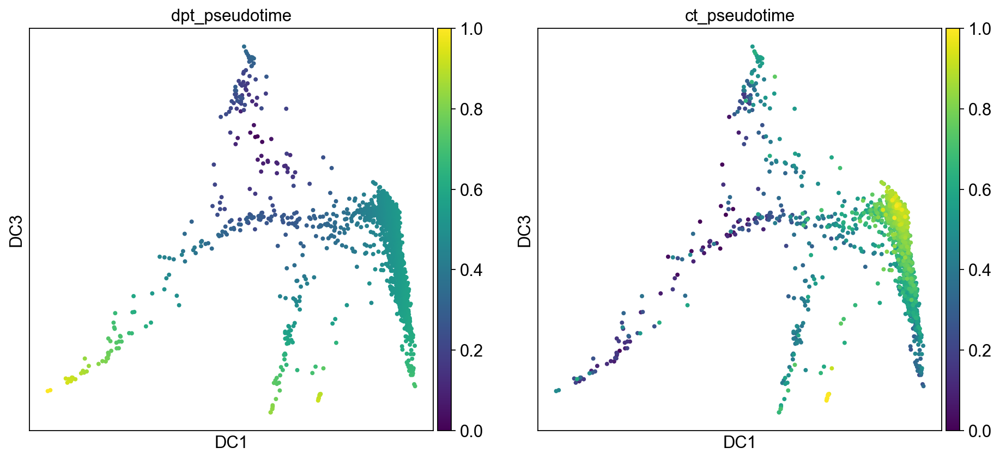

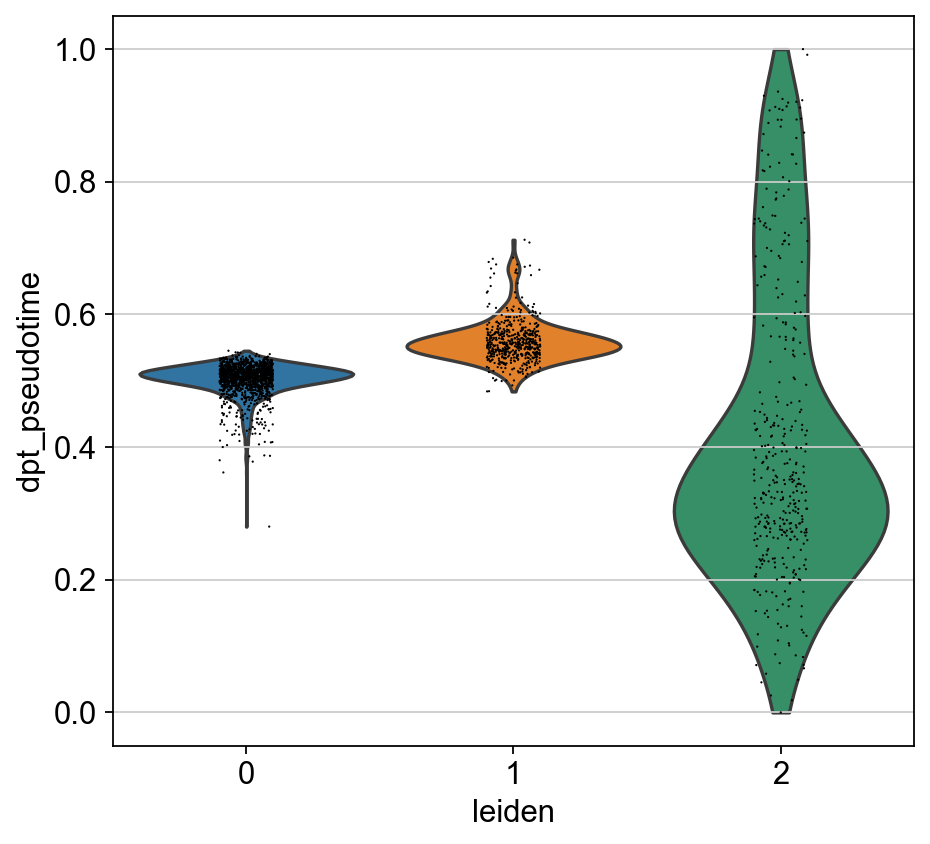

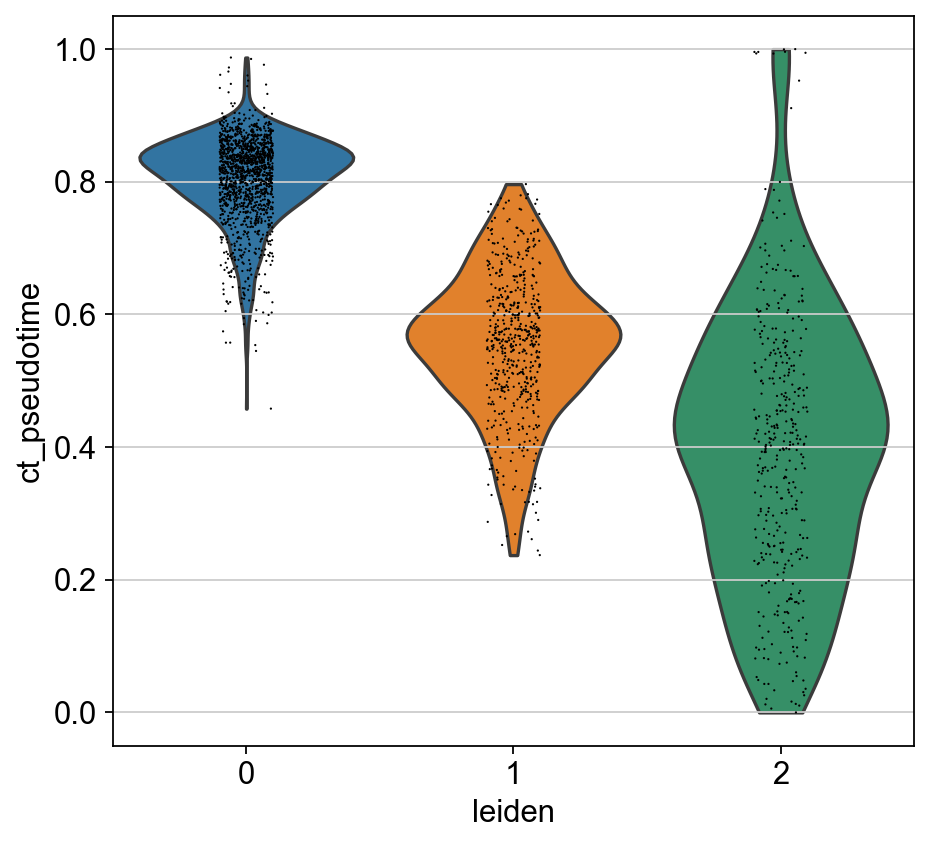

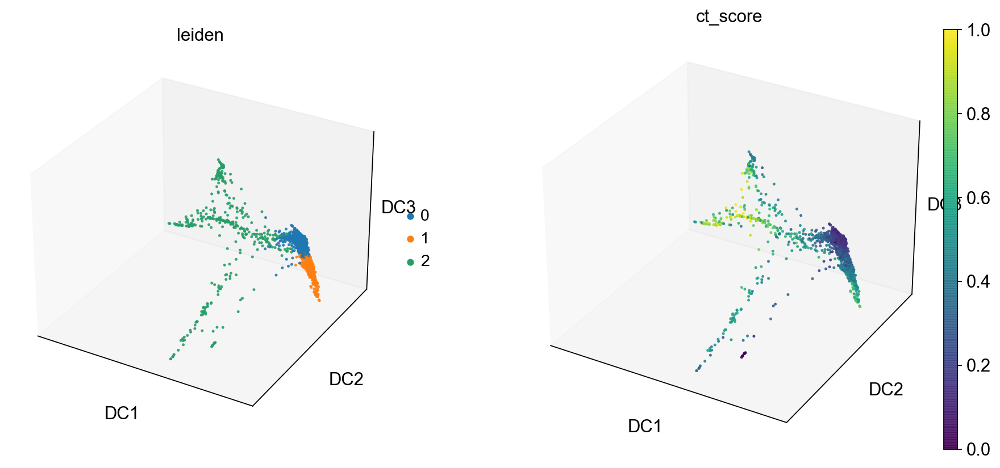

In [68]:
comparePlots(adXOld)

# COMMENTS

In the violin plots, both ct and dpt assign cluster 2 over a large range of pdt's. ct also assigns clusters 0 and 1 over larger ranges than dpt. Ct also assings much higher pdt's to cluster 0 than dpt, while the majority of cells in cluster 1 for both ct and dpt are centered just below .6. In the first plot, we can see that as we move from the right to the leftmost branch, dpt is much lighter at the tip than ct. This is the opposite case with the topmost branch. With the right most branch, CT is most yellow in the center, but as we move down, it becomes darker. DPT starts slightly darker at the center and as we move down becomes slightly lighter.

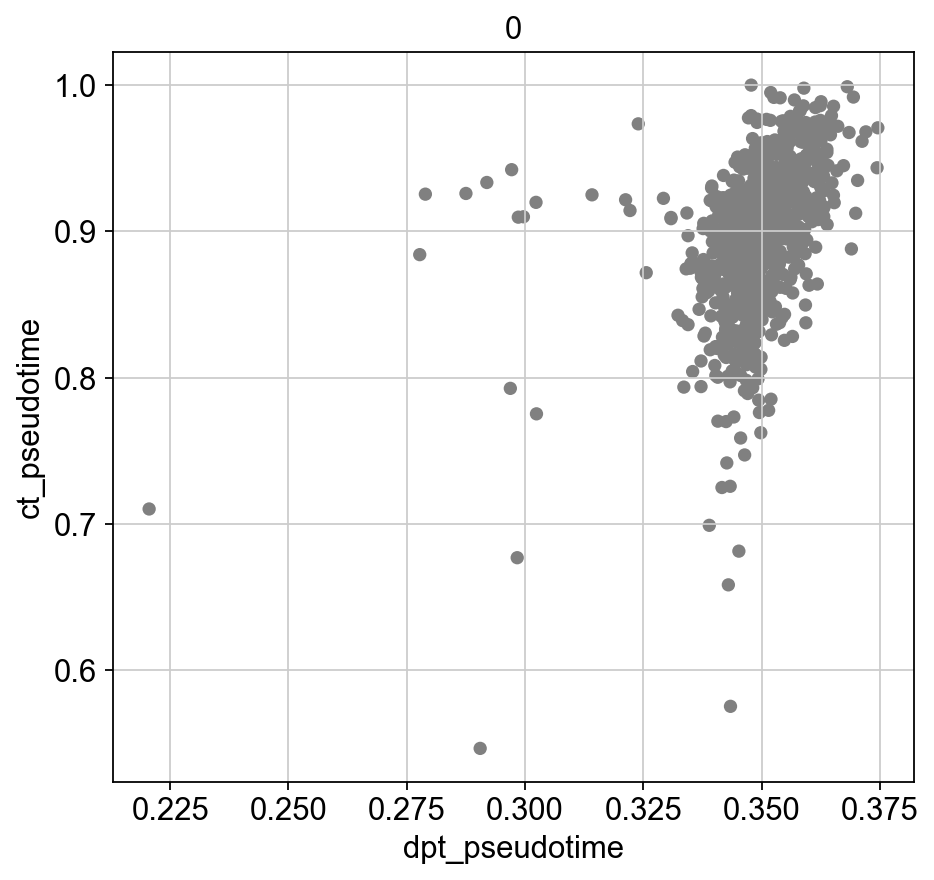

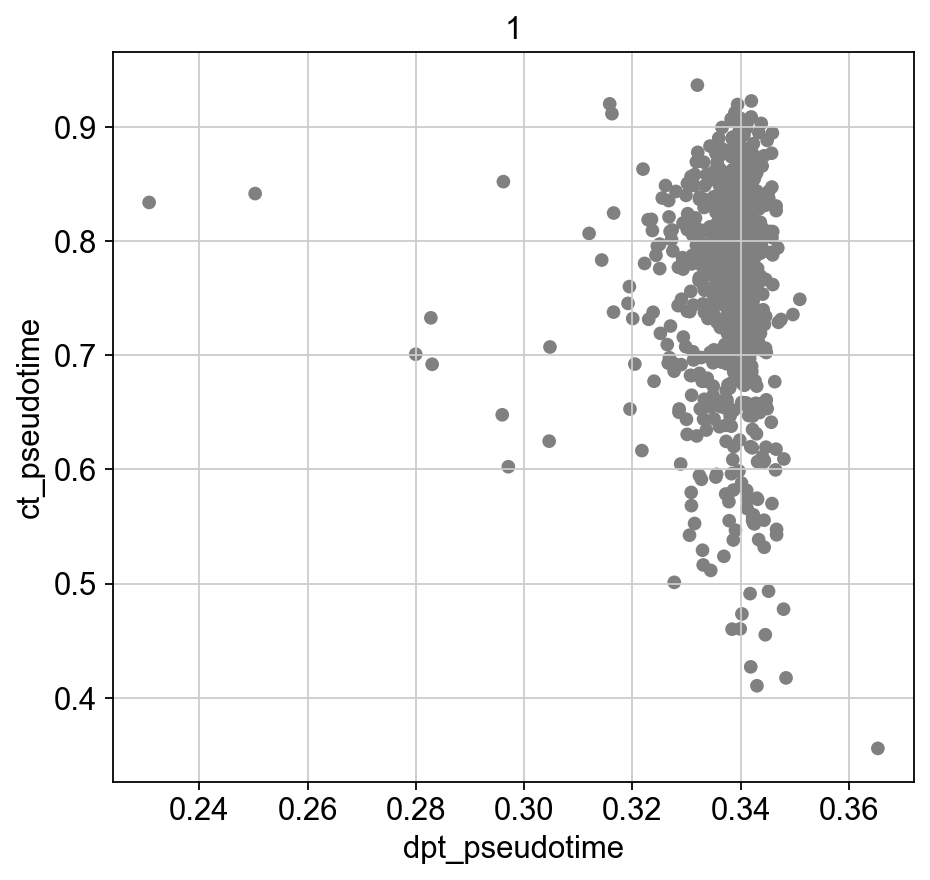

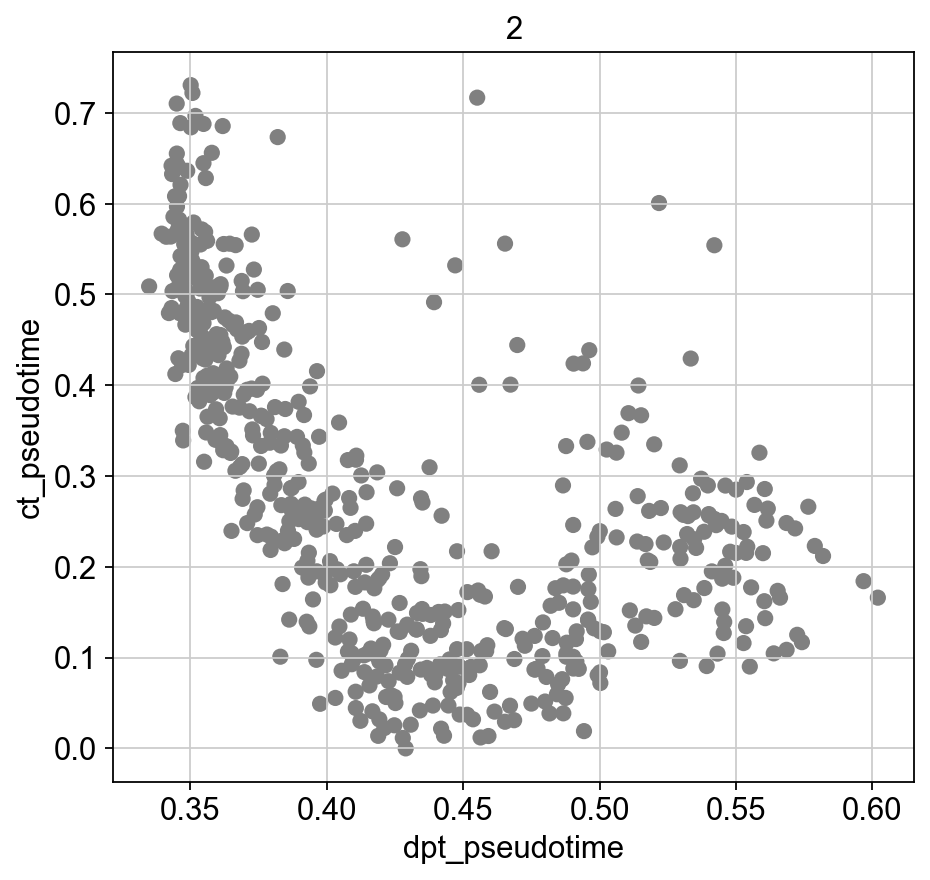

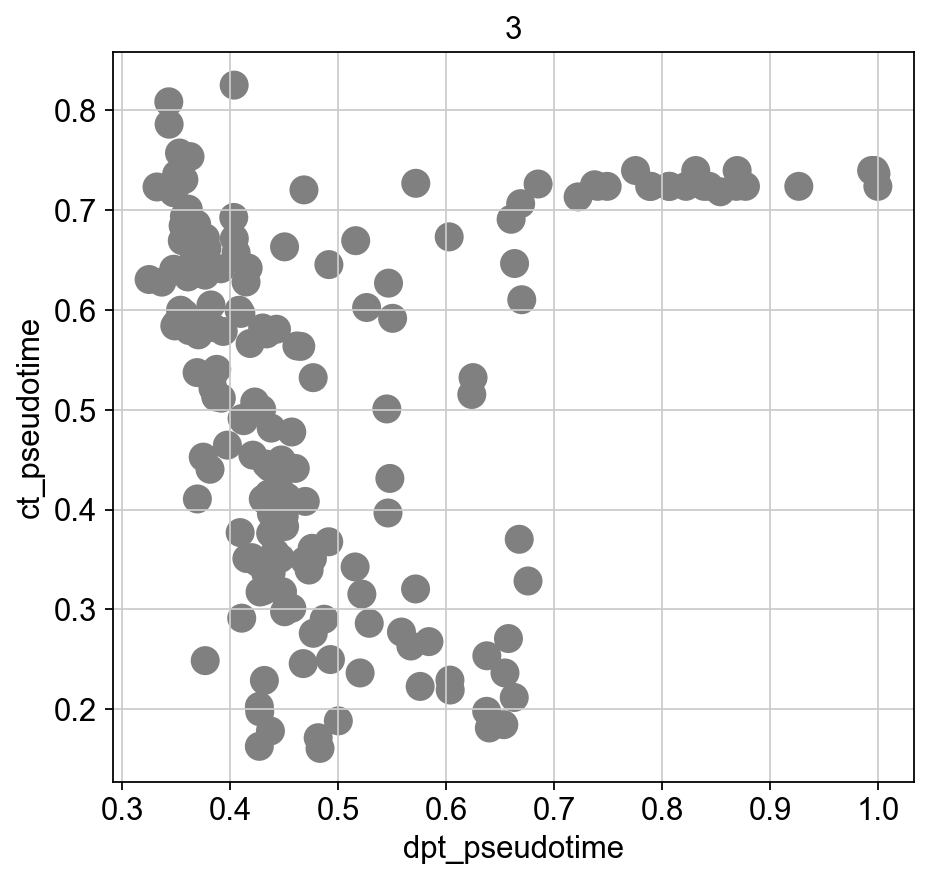

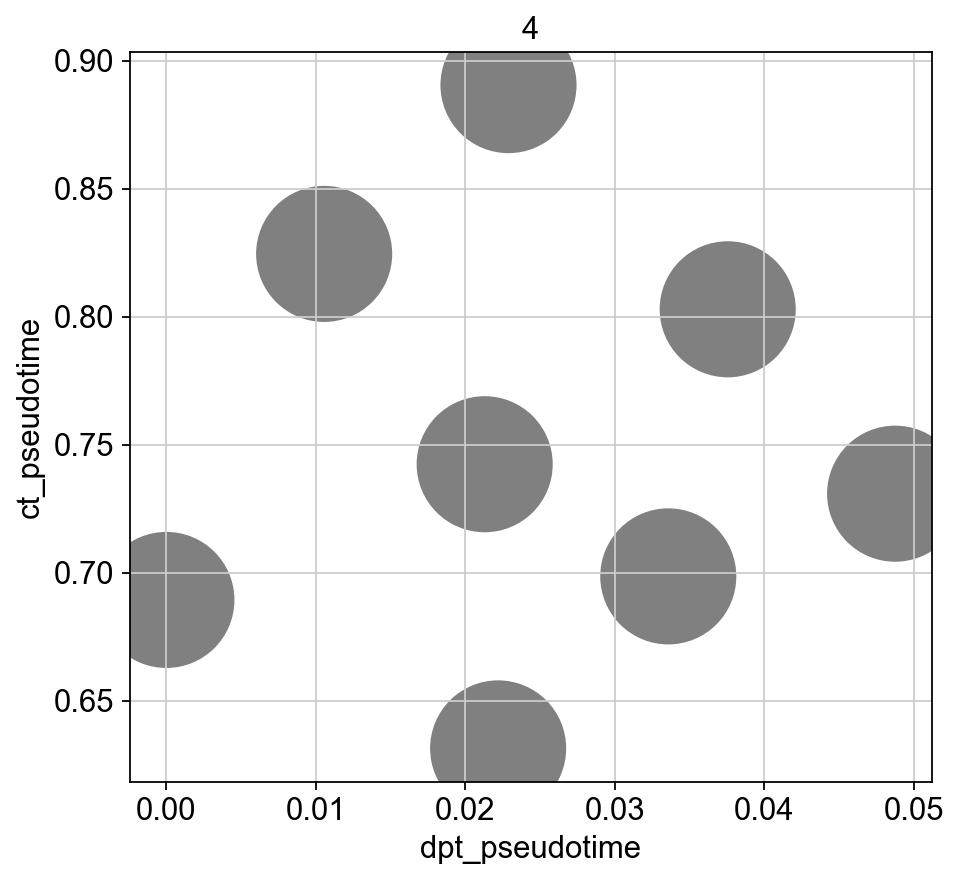

In [83]:
# look at relationship across cell types (clusters) between ct and pt using our funtion
# young
celltypeScatter(adXYoung)

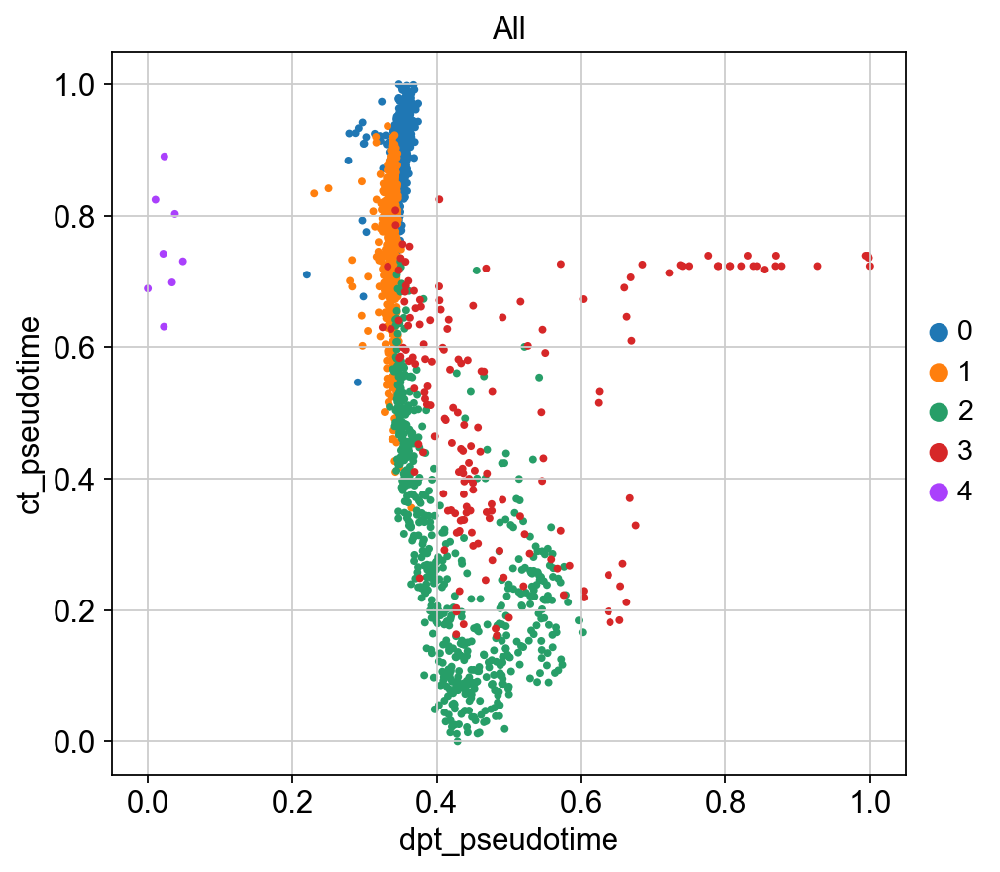

In [87]:
# scatter with all clusters colored by cluster
sc.pl.scatter(adXYoung, x = 'dpt_pseudotime', y = 'ct_pseudotime', title = 'All', color = 'leiden')

In the plot with all clusters, we can see a good amount of overlap for assigned pdt's for both methods. With cluster 4 we can see the large difference in assigned pdts by looking at how much greater then y values are than the x values in both the all scatter plot and the 4 scatter plot. Cluster 3 is pretty spread out for both. Cluster 2, ct pdts vary more than dpt pdts. Cluster 1 is pretty tight for dpt pdts with a few outliers while ct tends to vary more. Cluster 0 is pretty tight for both, but they both have a few outliers.

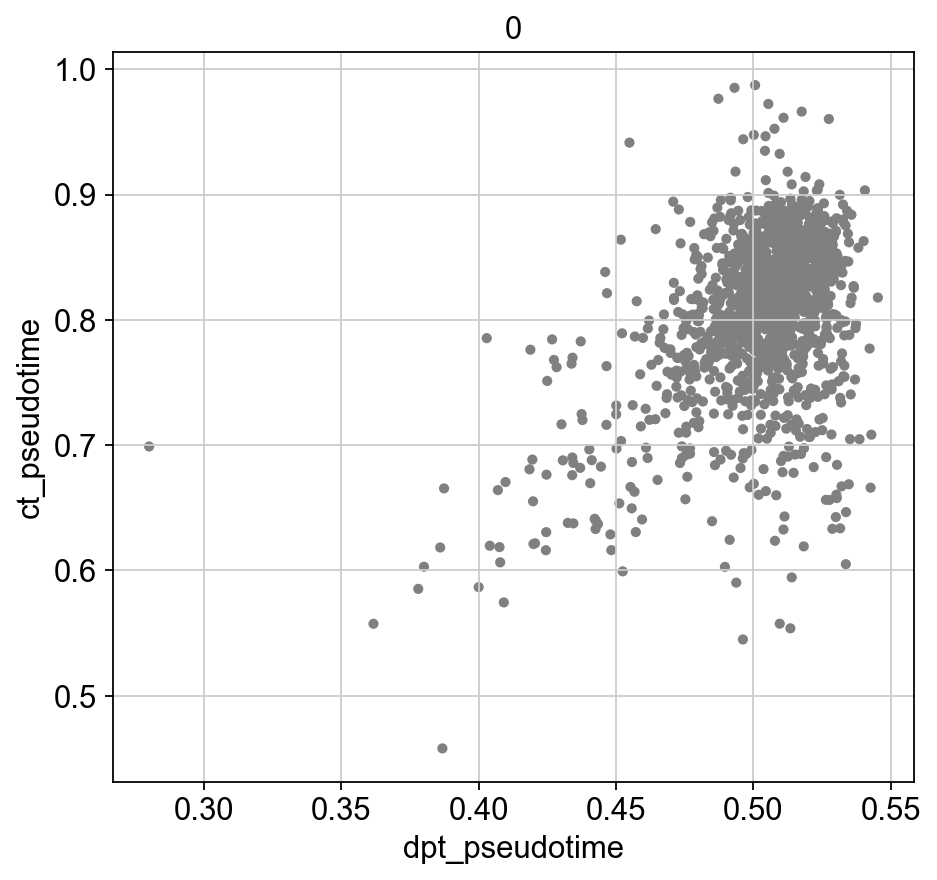

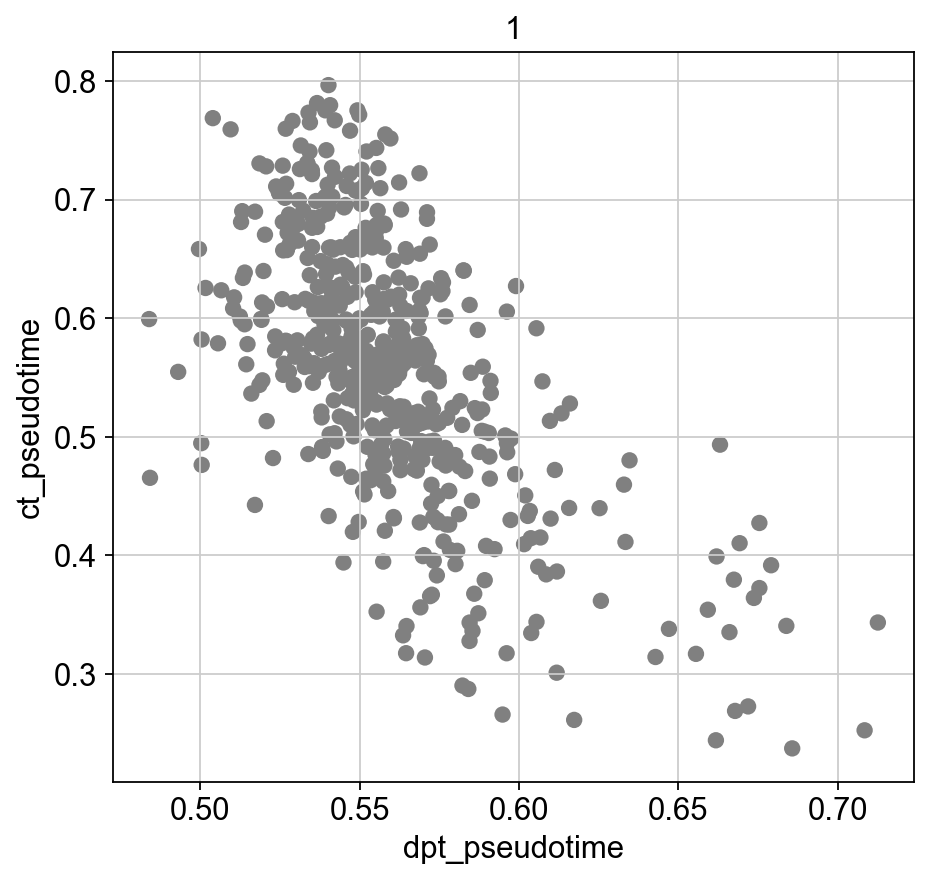

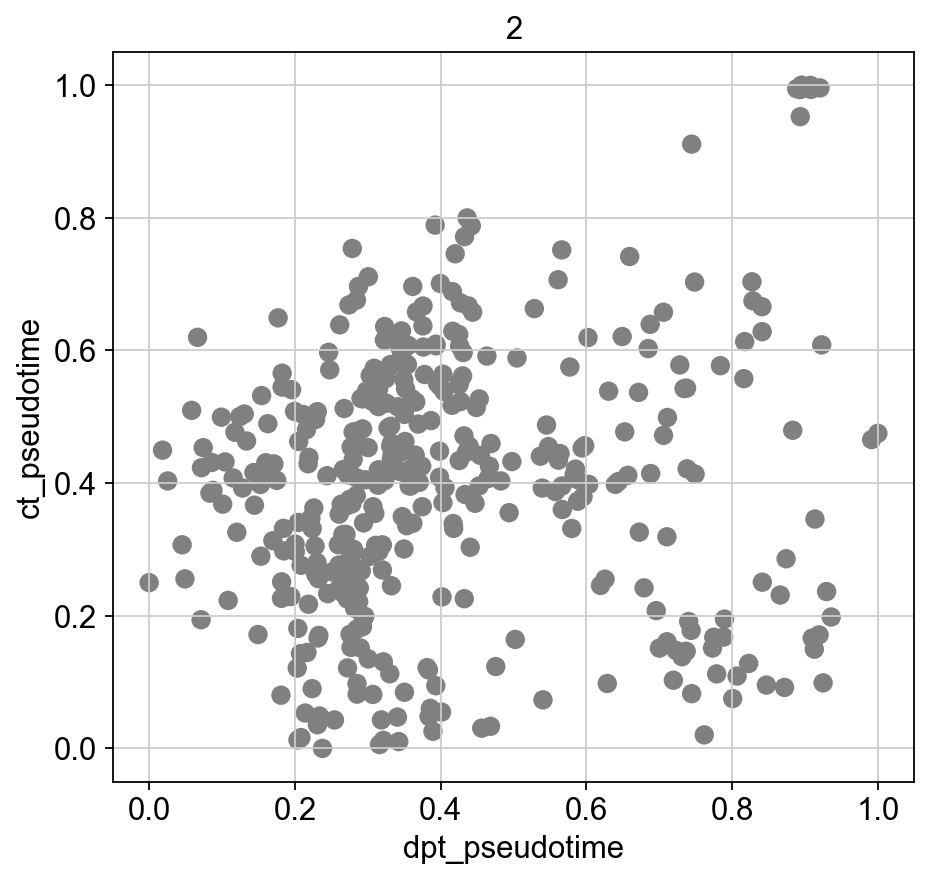

In [84]:
# same as above but for old
celltypeScatter(adXOld)

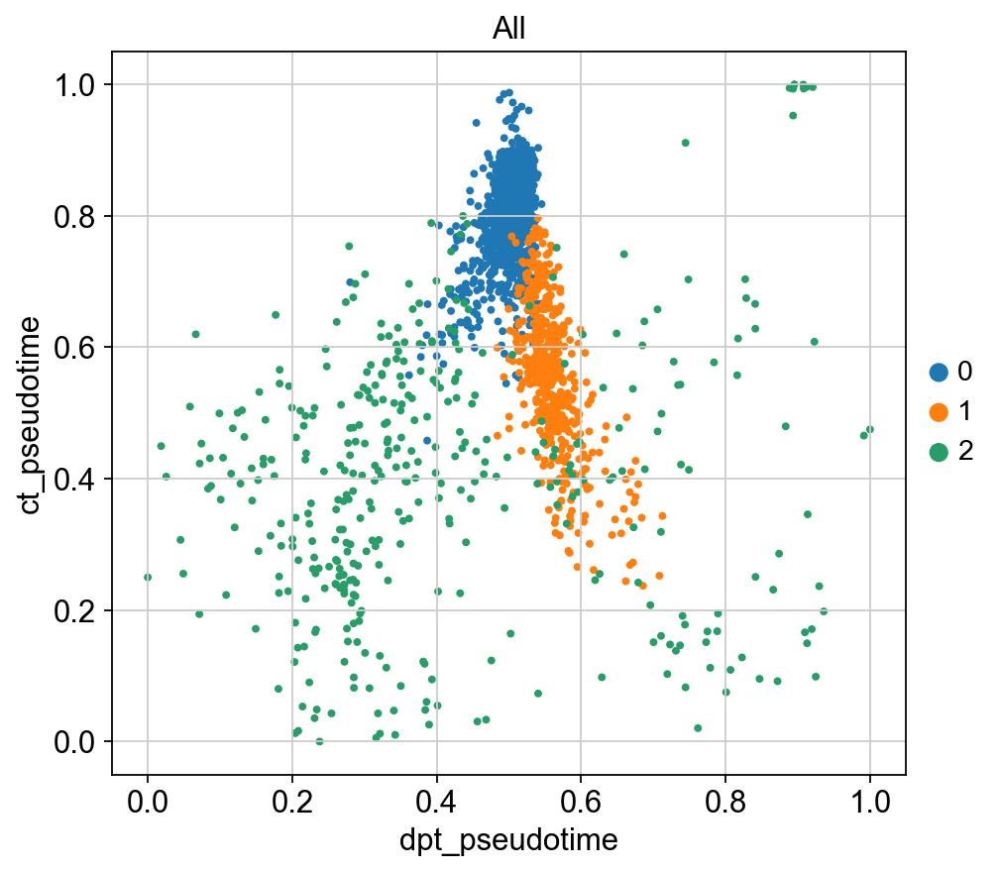

In [88]:
# scatter with all clusters colored by cluster
sc.pl.scatter(adXOld, x = 'dpt_pseudotime', y = 'ct_pseudotime', title = 'All', color = 'leiden')

In the above plots, we can see that cluster 2 is all over the place for both methods. For cluster one, the two methods seem inversly related; as dpt pdts increase ct pdts decrease (should indicate that one method is wrong?). Cluster 0 is quite tight for dpt with a little more variation in ct, but not as much as the other clusters. Once again, I would like to reiterate that these scatter plots are a more direct way for us to compare what we see in the previous violin plots, so they should contain the same info but it's easier to visualize the differences between the two methods with scatter plots. 